# 電動車 :對 PPT汽車版【電動車】相關討論輿情分析

第 16 組：M13400002 陳亭瑄、M134020016 王予芙、M134020019 黃亮慈、M134020043 張恩綮

影片連結：[專案介紹網址](https://youtu.be/MPm514fs9vE)

## A. 動機和分析目的
在當前全球氣候變遷與地球暖化日益嚴重的情況下，節能減碳已成為各國政府與企業不可忽視的重要議題。隨著國際間碳排放政策的推動，許多產業開始將「減碳」與「環保永續」納入核心發展方向。

另一方面，在民生層面，電動車作為一種低碳交通工具，變成除了傳統燃油車的對大宗選項。
我們想理解 對於民眾來說，電動車是否實用、或有哪些隱憂、或想考慮電動車的民眾有哪些考量。
例如：
1. 電動車對環境是否真的更友善？
2. 在實際使用層面上是否便利？
3. 油車與電動車在台灣的性價比比較？
4. 在轉換過程中，有哪些憂慮與阻力？
5. 想考慮電動車的人，最在意的是哪些實際因素（如品牌、電池壽命、充電站、補助、維修）？

PTT 汽車板聚集了大量適齡駕駛者及關心車輛與交通議題的用戶，具有高度主題關聯性。由於平台具備匿名特性，更能反映出用戶對電動車的真實偏好、疑慮與立場，因此我們想透過這個社群平台作為本研究進行情緒與輿情分析的資料來源。

## B. 資料集
使用 TarFlow 蒐集 PTT 汽車版(Car)文章
- 關鍵字：「電動車」
- 時間： 2021-06-14 ~ 2025-06-14
- 資料筆數：共 3979 篇文章

## C. 分析資料(包括文字資料和社會網絡資料)
我們使用課程中所教授的方法進行分析：

大綱：
1. 資料前處理
2. 分析 汽車板文章之詞彙關係
3. 利用 LIWC 進行情緒分析
4. 利用 SnowNLP 進行情緒分析
5. 主題分布的比例
6. LDA 主題模型
7. GuidedLDA
8. LLM主題分析
9. 中文社會網路分析

## D. 解釋分析的結果
總體來看，從 2021-2025 PPT 汽車版，
- 整體情緒為中立偏負面。
- 整體大概可以分成四大主題（最好的主題數，透過GuidedLDA）
- 整體會員互動率較低，整體關係零散

## 一、資料前處理

1.1. 引入套件

In [ ]:
# -------------------------------
# 資料處理與時間處理
# -------------------------------
import pandas as pd
import re
import time
import datetime

# -------------------------------
# 中文斷詞與語意分析
# -------------------------------
import jieba
import jieba.analyse

# 使用 CKIPtagger 進行詞性標註 / 命名實體辨識（進階用）
from ckiptagger import data_utils, construct_dictionary, WS, POS, NER

# -------------------------------
# 視覺化與字體設定
# -------------------------------
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from wordcloud import WordCloud

# 若在 Jupyter Notebook 中使用，加入這行以內嵌顯示圖表
%matplotlib inline


2025-06-14 21:59:13.399982: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


1.2. 繪圖相關設定

In [ ]:
# 設定圖的字體大小
plt.rcParams['font.size'] = 14

# 設定圖的中文字體 (無法顯示的話可以試試‘Microsoft JhengHei’字體)
# 也可參考：https://pyecontech.com/2020/03/27/python_matplotlib_chinese/
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms'] # MacOS 內建中文字體

# 設定文字雲中文字體路徑
FontPath = 'raw_data/SourceHanSansTW-Regular.otf' # 設定字型

In [ ]:
# 初始化斷詞引擎：不一定要設定，只使用內建效果也可以
# 參考網址：https://raw.githubusercontent.com/ldkrsi/jieba-zh_TW/master/jieba/dict.txt
jieba.set_dictionary('./dict/dict.txt')

# 載入自定義辭典：一個詞一行，每行分詞語、詞頻(可省)、詞性(可省)
jieba.load_userdict('./dict/user_dict.txt')

Building prefix dict from /Users/zhangxuanwen/Desktop/SMA/期末專案/dict/dict.txt ...
Loading model from cache /var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/jieba.uedfee81fd6d104b44e96282681122fde.cache
Loading model cost 0.781 seconds.
Prefix dict has been built successfully.


1.3. 讀取ptt檔案ppt_car.csv

In [ ]:
df = pd.read_csv('ppt_car.csv')
df.head()

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,hcmike,car,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\nhttps://str...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""DUNA"", ""cmtC...",59.126.18.236,2021-06-14 00:09:14,ptt
1,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,CHI7WEn,car,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,[],101.10.17.228,2021-06-16 00:10:21,ptt
2,3,https://www.ptt.cc/bbs/car/M.1623750446.A.B37....,[新聞]日產副社長「日產永遠不會放棄Skyline」,2021-06-15 17:47:24,owen1803,car,原文連結：\nhttps://autos.udn.com/autos/story/7826/...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""rainbow321"",...",118.167.41.99,2021-06-16 00:10:24,ptt
3,4,https://www.ptt.cc/bbs/car/M.1623821320.A.9B0....,[心得]TeslaModel34萬首次保養工單,2021-06-16 13:28:38,suggestjoy,car,先上圖\nhttp://i.imgur.com/XIZxr1f.jpg\n心得：工錢蠻微妙的...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""h20110"", ""cm...",39.8.224.250,2021-06-17 00:06:55,ptt
4,5,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,[問題]電動車後面沒車牌,2021-06-16 20:58:22,a6000200,car,電動車後面沒車牌\n\n今天在路邊停車格\n\n看到一台電動計程車\n\n後面沒車牌\n\n...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""asdhse"", ""cm...",39.10.130.179,2021-06-17 00:06:57,ptt


### 2. 資料初步清理
- 2.1. 清除內文為空值的文章

- 2.2. 清除不重要的字如換行、網址

In [ ]:
clear_df = df.copy()

#去除不會用到的欄位
drop_cols = ['artPoster','artComment', 'insertedDate', 'dataSource', 'artCatagory', 'e_ip']
clear_df.drop(drop_cols, axis = 1, inplace = True)

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)
clear_df.dropna(subset = ['artTitle'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','，', regex=True)

# 移除網址格式
clear_df["artContent"] = clear_df.artContent.apply(
    lambda x: re.sub("(http|https)://.*", "", x)
)
clear_df["sentence"] = clear_df["sentence"].apply(
    lambda x: re.sub("(http|https)://.*", "", x)
)
clear_df["artTitle"] = clear_df["artTitle"].apply(
    lambda x: re.sub("(http|https)://.*", "", x)
)

clear_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,想請教大大們。目前的新車 對於地上標線的辨識 會提醒駕駛嗎？，
1,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,*感謝版主審查後同意發文*。，大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份問卷想了...
2,3,https://www.ptt.cc/bbs/car/M.1623750446.A.B37....,[新聞]日產副社長「日產永遠不會放棄Skyline」,2021-06-15 17:47:24,原文連結：\n\n\n在上周末6/12《日本經濟新聞》獨家報導了Nissan日產汽車傳出要中...,原文連結：，
3,4,https://www.ptt.cc/bbs/car/M.1623821320.A.9B0....,[心得]TeslaModel34萬首次保養工單,2021-06-16 13:28:38,先上圖\n\n心得：工錢蠻微妙的\n\n2020年8月交車 現在里程4萬2左右 回廠繳個保護...,先上圖，
4,5,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,[問題]電動車後面沒車牌,2021-06-16 20:58:22,電動車後面沒車牌\n\n今天在路邊停車格\n\n看到一台電動計程車\n\n後面沒車牌\n\n...,電動車後面沒車牌。今天在路邊停車格。看到一台電動計程車。後面沒車牌。，前面有車牌。，請問各位...
5,6,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,[心得]Model3LR二次交車使用心得,2021-06-16 21:10:53,小弟前年有分享過model3 LR版本的使用心得\n後來因為自家社區車位沒有充電樁但老家透天...,小弟前年有分享過model3 LR版本的使用心得，後來因為自家社區車位沒有充電樁但老家透天有...
6,7,https://www.ptt.cc/bbs/car/M.1623857349.A.B43....,[新聞]Honda宣布停產燃料電池車Odyssey也將成,2021-06-16 23:29:07,原文連結：\n\n原文內容：\n日本本田汽車 (Honda)(7267-JP) 15 日 ...,原文連結：，
7,8,https://www.ptt.cc/bbs/car/M.1623927610.A.A33....,[新聞]Mazda發表至2030年全新技術和產品政策,2021-06-17 19:00:08,"原文連結：\n\n原文內容：\n\n\nMazda 自 2018 年發表了「""Zoom-Zo...",原文連結：，
8,9,https://www.ptt.cc/bbs/car/M.1624083884.A.0CE....,[新聞]外媒測試電動車的EPA里程和道路實測間的,2021-06-19 14:24:42,外媒測試電動車的EPA里程和道路實測間的差異\n\nEdmunds Tested: Elec...,外媒測試電動車的EPA里程和道路實測間的差異。Edmunds Tested: Electri...
9,10,https://www.ptt.cc/bbs/car/M.1624105092.A.0BA....,[分享]Model3連續27次0-200km/h實測數據分析,2021-06-19 20:18:09,因為Taycan號稱27次0-200km/h不衰退，挪威車主Bjorn用Model 3性能版...,因為Taycan號稱27次0-200km/h不衰退，挪威車主Bjorn用Model 3性能版...


### 3. 斷句

In [ ]:
clear_df['sentence'] = clear_df['sentence'].str.split("[,，。！!？?]{1,}")

sent_df = clear_df.explode('sentence').reset_index(drop=True)

sent_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,想請教大大們
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,目前的新車 對於地上標線的辨識 會提醒駕駛嗎
2,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,*感謝版主審查後同意發文*
4,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,大家好
5,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,我們是國泰金控數位數據暨科技發展中心；這裡有份問卷想了解【電動車車主駕
6,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,駛經驗】
7,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,希望能探索電動車的需求與機會點
8,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,從中分析金融服務應用整合的方
9,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,向


### 4. 斷詞

In [ ]:
# 初始化斷詞引擎：不一定要設定，只使用內建效果也可以
# 參考網址：https://raw.githubusercontent.com/ldkrsi/jieba-zh_TW/master/jieba/dict.txt
jieba.set_dictionary('dict/dict.txt')

In [ ]:
#去除句子中除了字母、數字、空白字符以外的符號
sent_df['sentence'] = sent_df['sentence'].str.replace(r'[^\w\s]+', '', regex=True).astype(str)

# 把長度小於1的sentence刪掉
sent_df = sent_df[sent_df["sentence"].str.len() > 1]

sent_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,想請教大大們
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,目前的新車 對於地上標線的辨識 會提醒駕駛嗎
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,感謝版主審查後同意發文
4,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,大家好
5,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,我們是國泰金控數位數據暨科技發展中心這裡有份問卷想了解電動車車主駕
6,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,駛經驗
7,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,希望能探索電動車的需求與機會點
8,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,從中分析金融服務應用整合的方
10,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,約10分鐘就可以填寫完成
11,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,一起來填問卷就有機會抽中價值1000 元的小樹點


In [ ]:
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 去除空值
word_df = word_df.dropna(subset=['word'])

# word_df = word_df.loc[word_df['word'].str.len() > 1]

word_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,word
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,想
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,大大
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,們
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,目前
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,的
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,對於
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上


### 5. 計算去除停用字及更新字典前的詞頻

In [ ]:
freq_df = pd.DataFrame(word_df['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()
freq_df.head(10)

,word,count
0,,23090
1,的,16557
2,是,6101
3,有,3567
4,電動車,3542
5,了,3424
6,在,3359
7,也,3273
8,就,2987
9,我,2833


### 6. 視覺化結果

#### 繪製詞頻為前10高的長條圖

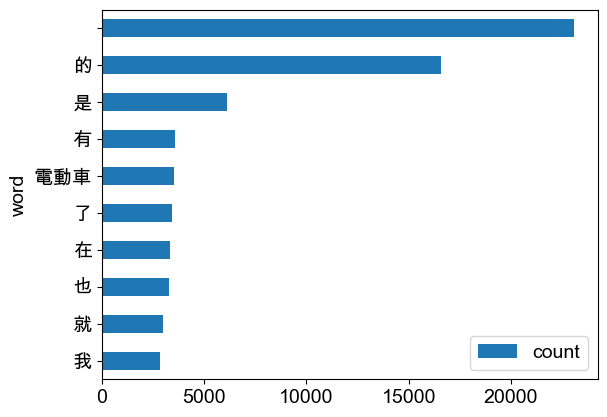

In [ ]:
freq_df.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

#### 6.1. 繪製文字雲

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

print(dict(list(freq_dict.items())[:10]))

{' ': 23090, '的': 16557, '是': 6101, '有': 3567, '電動車': 3542, '了': 3424, '在': 3359, '也': 3273, '就': 2987, '我': 2833}


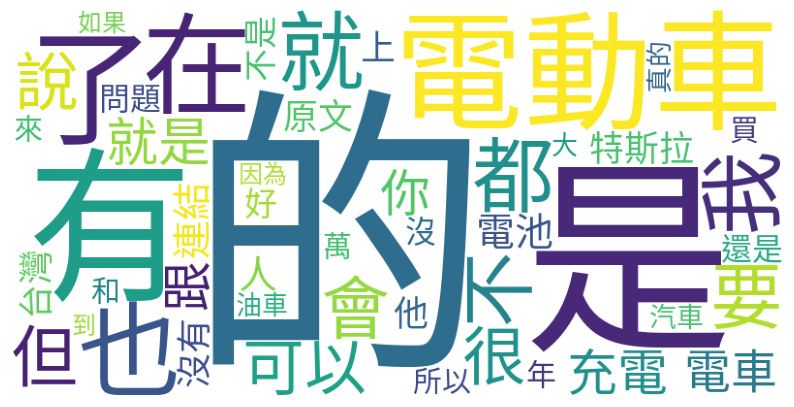

In [ ]:
# 繪製文字雲
wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

發現斷詞有許多一個字的結果，這些字對後續分析沒有意義，因此先去除斷詞結果少於兩個字的資料。

In [ ]:
#去除少於兩個字的詞語
word_df = word_df.loc[word_df['word'].str.len() > 1]

計算詞頻並繪製長條圖

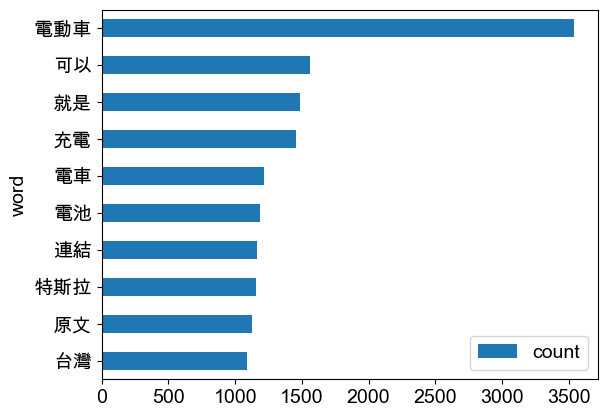

In [ ]:
freq_df = pd.DataFrame(word_df['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()

freq_df.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()

plt.show()

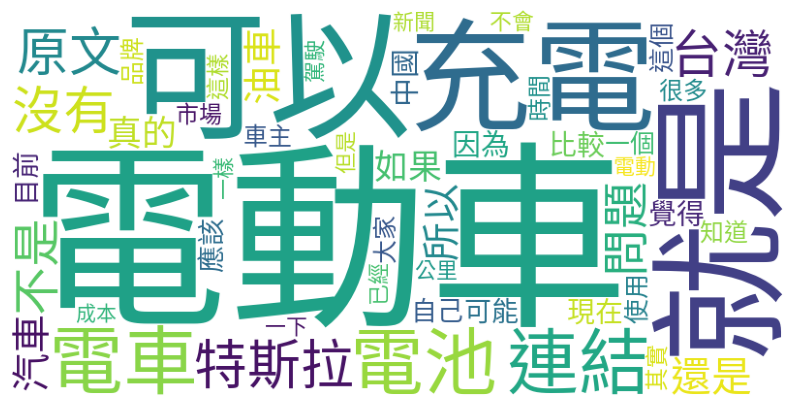

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

# 繪製文字雲
wordcloud_no1 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_no1.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_no1)
plt.axis('off')
plt.show()

### 7. 移除停用字

目前資料中還是有許多對後續分析沒有幫助的無意義詞彙，接下來要清除這些停用字。

In [ ]:
# 以檔案形式匯入通用的停用字檔案
# 將stopwords存成list
stopwords = [line.strip() for line in open('dict/stopwords.txt', 'r', encoding='utf-8').readlines()]

In [ ]:
noStop_df = word_df[~word_df['word'].isin(stopwords)]

noStop_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,word
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,目前
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,標線
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,辨識
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,提醒
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,駕駛
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,感謝
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,版主


### 8. 計算去除停用字後的詞頻

#### 8.1. 再次繪製長條圖

/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/583685406.py:1: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()


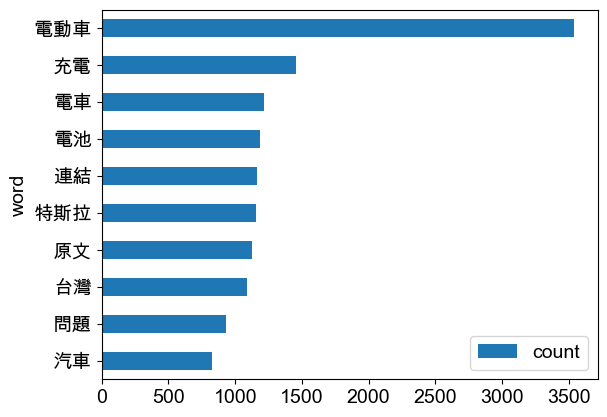

In [ ]:
freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()

freq_df_nostop.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

#### 再次繪製文字雲

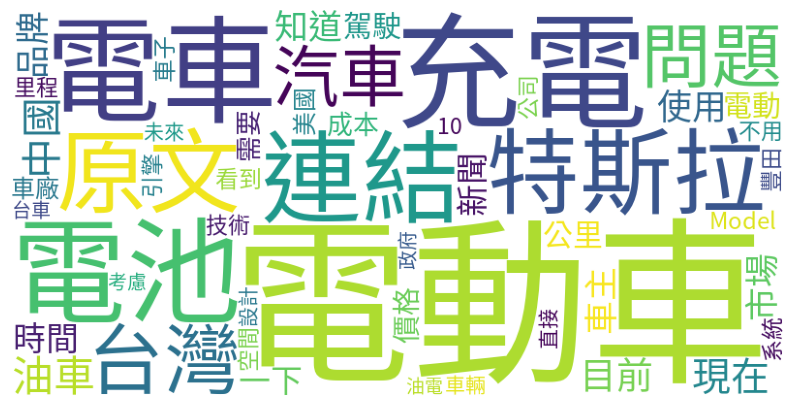

In [ ]:
freq_dict_nostop = freq_df_nostop.set_index('word').to_dict()
freq_dict_nostop = freq_dict_nostop['count']

# 繪製文字雲
wordcloud_nostop = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop.generate_from_frequencies(freq_dict_nostop)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.show()

比較「初步去除單個字」和「去除通用停用字」的差別。

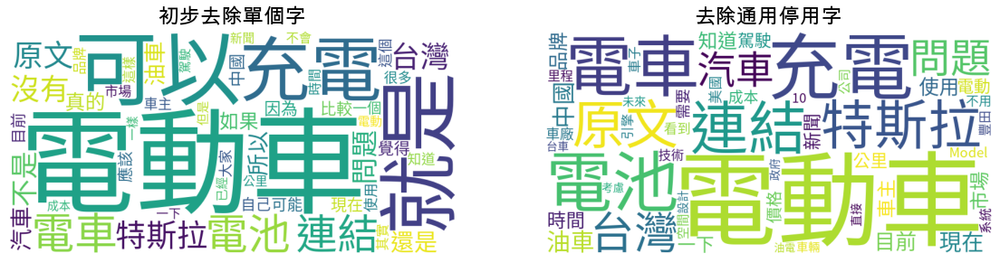

In [ ]:
plt.figure(figsize = (14,8))

plt.subplot(1,2,1)
plt.imshow(wordcloud_no1)
plt.axis('off')
plt.title("初步去除單個字")

plt.subplot(1,2,2)
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.title("去除通用停用字")

plt.show()

### 9. 更新停用字字典

In [ ]:
# 手動加入停用字
stopwords_manual = ["電動車", "看到", "原文", "時間", "一下", "知道", "不用", "這種", "最近", "電車"
                    , "目前", "直接", "一點", "一台", "之後", "現在", "需要", "最後", "好像", "根本"]
stopwords.extend(stopwords_manual)

In [ ]:
noStop_df_2 = noStop_df[~noStop_df['word'].isin(stopwords)]
noStop_df_2.head(10)

,system_id,artUrl,artTitle,artDate,artContent,word
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,標線
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,辨識
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,提醒
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,駕駛
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,感謝
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,版主
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15 10:30:12,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,審查


#### 再次繪製文字雲

/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/1032659861.py:2: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()


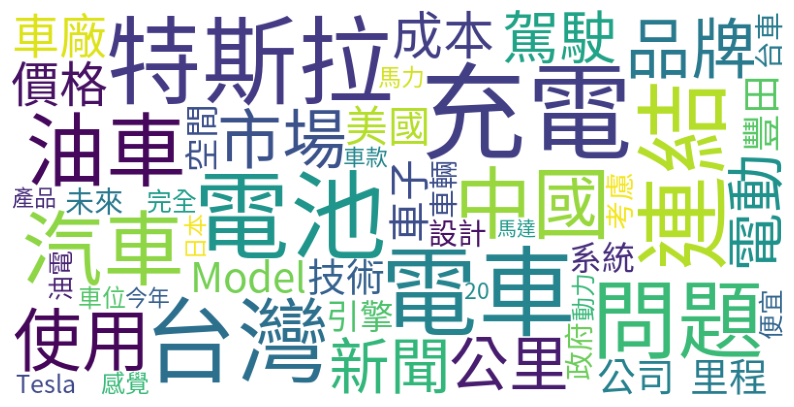

In [ ]:
# 計算詞頻
freq_df_nostop_2 = pd.DataFrame(pd.value_counts(noStop_df_2['word'])).sort_values(by = ['count'], ascending = False).reset_index()

# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_nostop_2 = freq_df_nostop_2.set_index('word').to_dict()
freq_dict_nostop_2 = freq_dict_nostop_2['count']

# 繪製文字雲
wordcloud_nostop_2 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop_2.generate_from_frequencies(freq_dict_nostop_2)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop_2)
plt.axis('off')
plt.show()

透過文字雲看一下目前為止做的文字處理結果有什麼差異

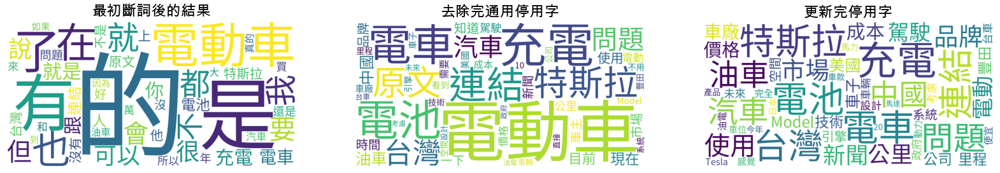

In [ ]:
plt.figure(figsize = (20,14))

plt.subplot(1,3,1)
plt.imshow(wordcloud)
plt.axis('off')
plt.title("最初斷詞後的結果")

plt.subplot(1,3,2)
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.title("去除完通用停用字")

plt.subplot(1,3,3)
plt.imshow(wordcloud_nostop_2)
plt.axis('off')
plt.title("更新完停用字")

plt.show()

### 10. 更新斷詞字典

| 分類            | 詞彙列表                                                                                                                  | 功能與意義                                      |
| ------------- | --------------------------------------------------------------------------------------------------------------------- | ------------------------------------------ |
|  電動車品牌與車型名稱 | `Model_3`, `Model_Y`, `Model_S`, `Model_X`, `Tesla_Model_3`, `Tesla_Model_Y`, `特斯拉`, `特斯拉_Model_3`, `BYD_海豹`, `BYD_漢` | 用於識別討論焦點是哪個品牌/車型，進行品牌或車款層級的情緒分析            |
|  電池類型       | `三元鋰電池`, `磷酸鐵鋰`                                                                                                       | 區分不同技術方案，關聯續航、安全、壽命等議題，協助辨識情緒來源            |
|  充電與續航詞      | `快充`, `慢充`, `續航力`, `充電樁`, `續航焦慮`                                                                                      | 表示消費者對「補能效率」與「里程」的關注，是情緒起伏高的關鍵主題           |
|  駕駛與科技功能    | `輔助駕駛`, `自動駕駛`, `FSD`, `Autopilot`, `OTA更新`, `車機系統`, `中控螢幕`                                                           | 與車輛的科技配備與駕駛體驗相關，便於後續分析科技信任度、操作便利性的情緒連結     |
|  使用感受關鍵詞   | `空間大`                                                                                                                 | 反映用戶對內裝/乘坐體驗的觀察，有助於理解使用者滿意或抱怨的內容是否聚焦在空間設計上 |


In [ ]:
# 載入自定義辭典
jieba.load_userdict("dict/user_dict.txt")

#### 重新斷詞

In [ ]:
word_df_updated = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

word_df_updated = word_df_updated.loc[word_df_updated['word'].str.len()>1]
word_df_updated

,system_id,artUrl,artTitle,artDate,artContent,word
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,大大
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,目前
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,對於
...,...,...,...,...,...,...
62500,3978,https://www.ptt.cc/bbs/car/M.1749792065.A.0E0....,[新聞]川普宣稱正在拯救美國汽車業 正式簽署,2025-06-13 13:21:03,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售\n\n美國總統川普...,阻止
62500,3978,https://www.ptt.cc/bbs/car/M.1749792065.A.0E0....,[新聞]川普宣稱正在拯救美國汽車業 正式簽署,2025-06-13 13:21:03,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售\n\n美國總統川普...,燃油車
62500,3978,https://www.ptt.cc/bbs/car/M.1749792065.A.0E0....,[新聞]川普宣稱正在拯救美國汽車業 正式簽署,2025-06-13 13:21:03,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售\n\n美國總統川普...,販售
62502,3979,https://www.ptt.cc/bbs/car/M.1749809541.A.27C....,[情報]AppleCarPlay即將開放影片播放功能？,2025-06-13 18:12:13,相關連結：\n\n\n\n長達10年禁止 CarPlay 上播放影片的政策，即將劃下句點！蘋...,相關


#### 重新移除停用字

In [ ]:
nostop_df_updated = word_df_updated[~word_df_updated['word'].isin(stopwords)]

nostop_df_updated

,system_id,artUrl,artTitle,artDate,artContent,word
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,標線
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14 00:06:37,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,辨識
...,...,...,...,...,...,...
62500,3978,https://www.ptt.cc/bbs/car/M.1749792065.A.0E0....,[新聞]川普宣稱正在拯救美國汽車業 正式簽署,2025-06-13 13:21:03,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售\n\n美國總統川普...,阻止
62500,3978,https://www.ptt.cc/bbs/car/M.1749792065.A.0E0....,[新聞]川普宣稱正在拯救美國汽車業 正式簽署,2025-06-13 13:21:03,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售\n\n美國總統川普...,燃油車
62500,3978,https://www.ptt.cc/bbs/car/M.1749792065.A.0E0....,[新聞]川普宣稱正在拯救美國汽車業 正式簽署,2025-06-13 13:21:03,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售\n\n美國總統川普...,販售
62502,3979,https://www.ptt.cc/bbs/car/M.1749809541.A.27C....,[情報]AppleCarPlay即將開放影片播放功能？,2025-06-13 18:12:13,相關連結：\n\n\n\n長達10年禁止 CarPlay 上播放影片的政策，即將劃下句點！蘋...,相關


#### 重新計算詞頻

In [ ]:
freq_df_updated = pd.DataFrame(pd.value_counts(nostop_df_updated['word'])).sort_values(by = ['count'], ascending = False).reset_index()

freq_df_updated.head(10)

/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/1450957720.py:1: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  freq_df_updated = pd.DataFrame(pd.value_counts(nostop_df_updated['word'])).sort_values(by = ['count'], ascending = False).reset_index()


,word,count
0,電池,1179
1,連結,1164
2,特斯拉,1154
3,台灣,1087
4,充電,993
5,問題,934
6,汽車,828
7,油車,816
8,中國,773
9,使用,578


#### 重新繪製詞頻長條圖

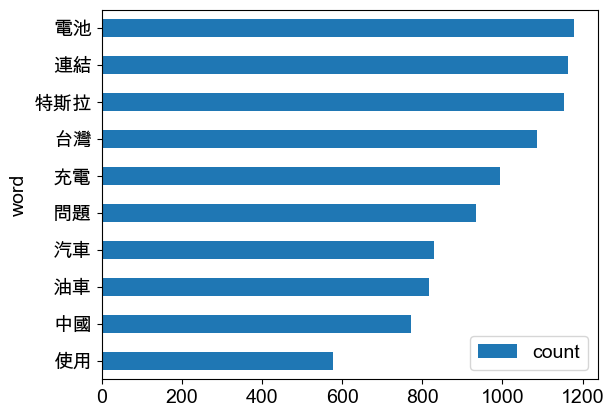

In [ ]:
freq_df_updated.head(10).plot.barh(x='word', y='count').invert_yaxis()
plt.show()

#### 繪製文字雲

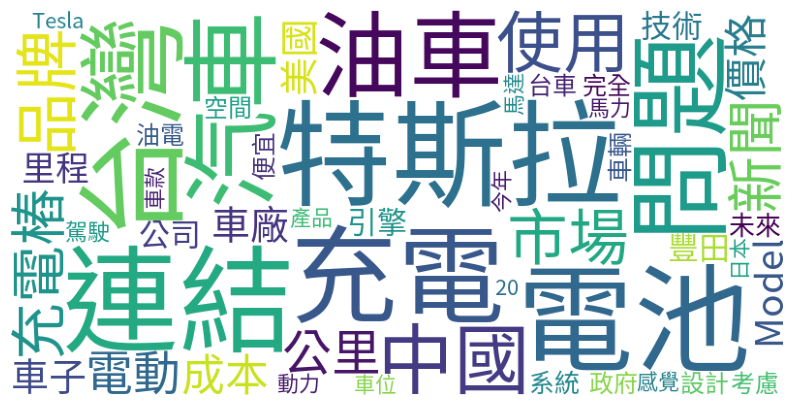

In [ ]:
freq_dict_updated = freq_df_updated.set_index('word').to_dict()
freq_dict_updated = freq_dict_updated['count']

# 繪製文字雲
wordcloud_after = WordCloud(background_color='white', width=800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_after.generate_from_frequencies(freq_dict_updated)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_after)
plt.axis('off')
plt.show()

### 11. 比較清理前後的文字雲

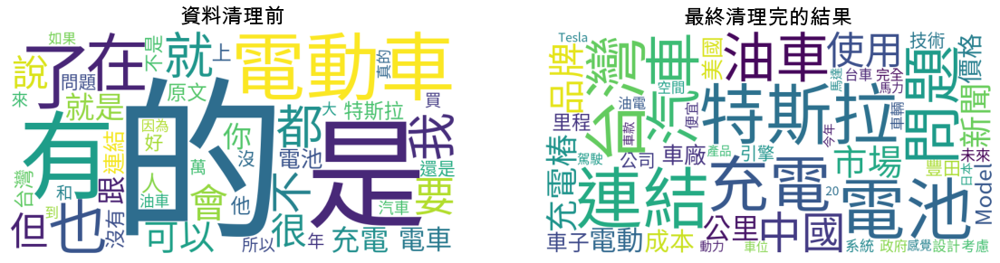

In [ ]:
plt.figure(figsize = (14,8))

plt.subplot(1,2,1)
plt.imshow(wordcloud)
plt.axis('off')
plt.title("資料清理前")

plt.subplot(1,2,2)
plt.imshow(wordcloud_after)
plt.axis('off')
plt.title("最終清理完的結果")

plt.show()

## 二、使用 LIWC辭典 進行 情緒分析

### 1. 載入情緒字典

In [ ]:
liwc_dict = pd.read_csv("./dict/liwc/LIWC_CH.csv")
liwc_dict = liwc_dict.rename(columns={'name': 'word', "class": 'sentiments'})
liwc_dict.head()

,word,sentiments
0,):,affect
1,3q,affect
2,:(,affect
3,:),affect
4,<3,affect


In [ ]:
fprop = fm.FontProperties(fname="./raw_data/SourceHanSansTW-Regular.otf")

# 設定整份 notebook 圖片的長寬與 dpi
plt.rcParams["figure.figsize"] = [6, 4]
plt.rcParams["figure.dpi"] = 150

In [ ]:
nostop_df_updated["artDate"] = pd.to_datetime(nostop_df_updated["artDate"])
nostop_df_updated['artDate'] = nostop_df_updated['artDate'].dt.date

In [ ]:
# 將情緒字典和原始資料合併
ptt_liwc_df = pd.merge(nostop_df_updated[["artUrl", "artDate", "artTitle", "artContent", "word"]], liwc_dict, how="left")
ptt_liwc_df.head()

,artUrl,artDate,artTitle,artContent,word,sentiments
0,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教,NaN
1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車,NaN
2,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上,NaN
3,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,標線,NaN
4,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,辨識,NaN


### 2. 正負向情緒詞彙頻率折線圖圖

In [ ]:
sentiment_count = pd.DataFrame(
    ptt_liwc_df.groupby(["artDate", "sentiments"]).size()
).reset_index()

mask = (sentiment_count['sentiments'] == "positive") | (sentiment_count['sentiments'] == "negative")
sentiment_count = sentiment_count.loc[mask]

sentiment_count = sentiment_count.rename(columns={0: "size"})
sentiment_count = sentiment_count.sort_values(["artDate"])
sentiment_count.head(10)

,artDate,sentiments,size
1,2021-06-15,positive,3
4,2021-06-16,negative,4
5,2021-06-16,positive,10
7,2021-06-19,negative,2
9,2021-06-20,negative,7
10,2021-06-20,positive,2
15,2021-06-21,negative,2
16,2021-06-21,positive,2
19,2021-06-22,positive,1
23,2021-06-23,positive,1


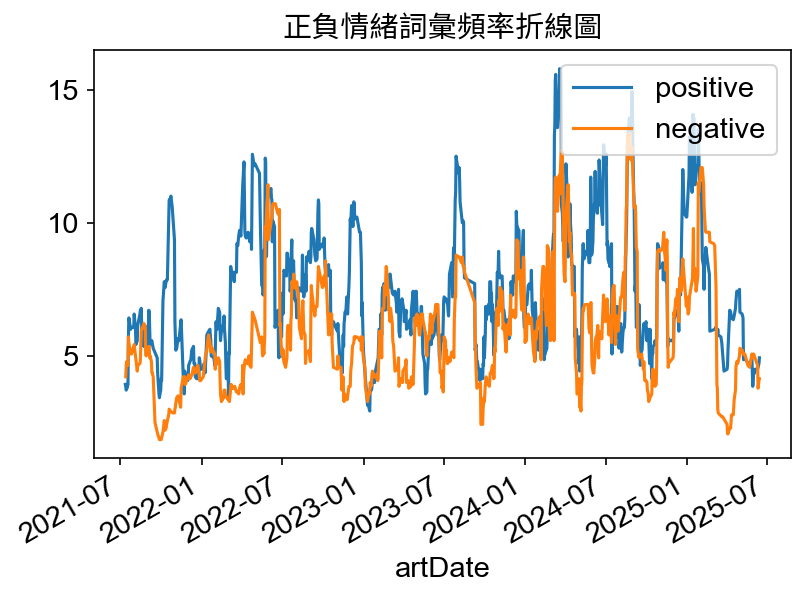

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

fig, ax = plt.subplots()

rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[1])

plt.xlabel("artDate")
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負情緒詞彙頻率折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

2021年：
- 美國拜登基礎建設法案（2021 年 11 月）預計投入 75 億美元建設 50 萬座充電站。
- 特斯拉 Model 3 在 2021 年 6 月累計銷售突破 100 萬輛關卡，成為現代首個達成這項里程碑的電動車型。

2022年：
- 全球：推出大量新車、各國持續增設補助與充電站網絡。
- 缺：多起電池起火、回收事件。Tesla 多次大規模召回與軟體瑕疵。某些廠因揮發性有機物排放被地方政府調查，環境與社會爭議浮上檯面。

2023年：
- 充電基礎設施大幅擴充、特定廠商投入新產能（豐田宣布在美國北卡擴建 EV 電池廠投資增額）
- 負面聲量較低。

2024年：
- 馬克思失言、特斯拉品牌聲譽下降。
- 電池成本下降。電動車銷量穩定持續成長。

2025年：
- 新車款、快充策略、電池技術與成本優化、二手價格選擇好又多、（台灣人較留意的）小米釋出新款消息
- 軟體安全、隱私風險、政府補貼不確定性

從分析結果來看，正負向情緒差不多，但有幾個部分是正向情緒明顯比較高。

### 3. 正負向情緒詞彙比例折線圖圖

In [ ]:
sentiment_count = sentiment_count.assign(
    ratio=sentiment_count.groupby("artDate")["size"].transform(lambda n: n / n.sum())
)
sentiment_count.head(10)

,artDate,sentiments,size,ratio
1,2021-06-15,positive,3,1.000000
4,2021-06-16,negative,4,0.285714
5,2021-06-16,positive,10,0.714286
7,2021-06-19,negative,2,1.000000
9,2021-06-20,negative,7,0.777778
10,2021-06-20,positive,2,0.222222
15,2021-06-21,negative,2,0.500000
16,2021-06-21,positive,2,0.500000
19,2021-06-22,positive,1,1.000000
23,2021-06-23,positive,1,0.500000


In [ ]:
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

Text(0.5, 1.0, '正負情緒比例折線圖')

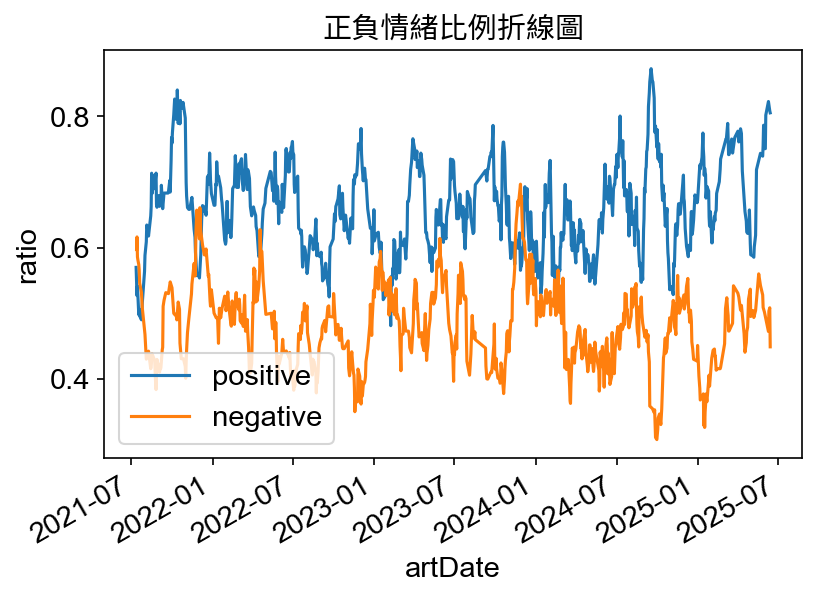

In [ ]:
fig, ax = plt.subplots()

rolling_days = 14
ax.plot(pos["artDate"], pos["ratio"].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["ratio"].rolling(rolling_days).mean(), color=colors[1])

plt.xlabel("artDate")
plt.ylabel("ratio")
ax.legend(["positive", "negative"], loc="lower left")
fig.autofmt_xdate()
plt.title("正負情緒比例折線圖", fontproperties=fprop)

如果我們改用「比例」來看情緒詞的變化，就能更準確地觀察某一種情緒在整體情緒詞中的佔比。這樣一來，即使某天的文章數量比較多，也不會影響比例的判斷。

從「比例圖」中可以看出，和單純的「詞頻圖」結果不太一樣，大多數時間正向情緒的比例都高於負向情緒。
表示民眾雖對電動車有較多正面的想法，但同時仍因他的不確定性、安全性、隱私性產生了負向情緒。

### 4. 正負向情緒分數折線圖

In [ ]:
ptt_sentiment_value = (
    sentiment_count.pivot_table(
        index="artDate", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)
ptt_sentiment_value.head()

,artDate,negative,positive
0,2021-06-15,0.0,3.0
1,2021-06-16,4.0,10.0
2,2021-06-19,2.0,0.0
3,2021-06-20,7.0,2.0
4,2021-06-21,2.0,2.0


In [ ]:
# sentiment 計算方式: positive - negative
ptt_sentiment_value["sentiment_value"] = (
    ptt_sentiment_value["positive"]
    - ptt_sentiment_value["negative"]
)
ptt_sentiment_value.head()

,artDate,negative,positive,sentiment_value
0,2021-06-15,0.0,3.0,3.0
1,2021-06-16,4.0,10.0,6.0
2,2021-06-19,2.0,0.0,-2.0
3,2021-06-20,7.0,2.0,-5.0
4,2021-06-21,2.0,2.0,0.0


Text(0.5, 1.0, '正負情緒分數趨勢折線圖')

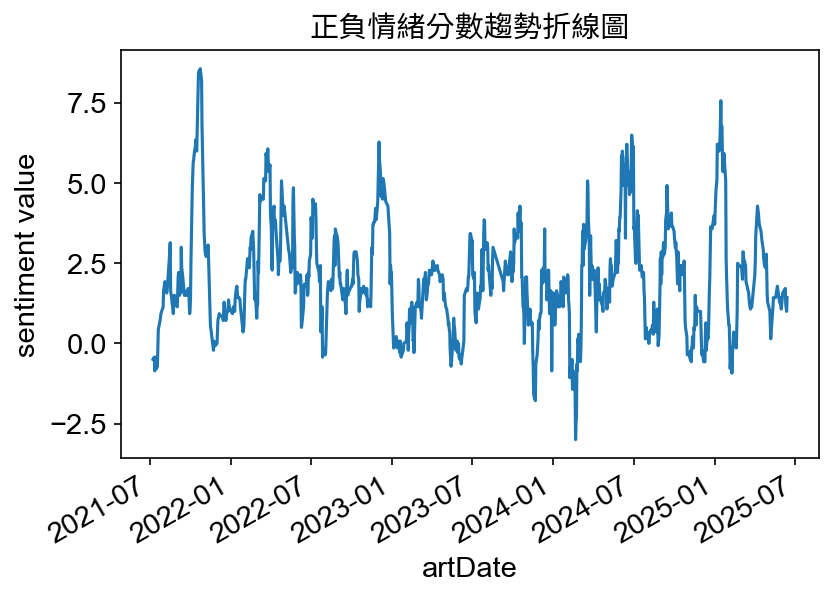

In [ ]:
fig, ax = plt.subplots()

rolling_days = 14
ax.plot(ptt_sentiment_value["artDate"], ptt_sentiment_value["sentiment_value"].rolling(rolling_days).mean())
ax.set_xlabel("artDate")
ax.set_ylabel("sentiment value")
fig.autofmt_xdate()
plt.title("正負情緒分數趨勢折線圖", fontproperties=fprop)

從結果來看，2024 年 2 月到 4 月之間的情緒分數相對偏低。

可以看到幾個高峰，
正向：
- 2021年中到年末
- 2025年初到年中：因小米發表新車款預告、釋出設計與功能細節，因此引發媒體與社群大量討論。

負向：
- 2024整年：
  - 特斯拉(Tesla) 品牌價值下滑:因馬克思的言論爭議、產品線老化
  - 供應鏈問題
  - 能源問題（開銷、資費設計）

### 5. 文章為單位的情緒分析

In [ ]:
sentiment_count_by_article = pd.DataFrame(
    ptt_liwc_df.groupby(["artUrl", "sentiments"]).size()
).reset_index()
sentiment_count_by_article = sentiment_count_by_article.rename(columns={0: "size"})
sentiment_count_by_article.head(10)

,artUrl,sentiments,size
0,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,affect,3
1,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,positive,3
2,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,affect,1
3,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,positive,1
4,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,affect,13
5,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,anx,2
6,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,negative,4
7,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,positive,9
8,https://www.ptt.cc/bbs/car/M.1624105092.A.0BA....,affect,2
9,https://www.ptt.cc/bbs/car/M.1624105092.A.0BA....,negative,2


In [ ]:
ptt_sentiment_value_by_article = (
    sentiment_count_by_article.pivot_table(
        index="artUrl", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)
ptt_sentiment_value_by_article.head()

,artUrl,affect,anger,anx,negative,positive,sad
0,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,3.0,0.0,0.0,0.0,3.0,0.0
1,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,1.0,0.0,0.0,0.0,1.0,0.0
2,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,13.0,0.0,2.0,4.0,9.0,0.0
3,https://www.ptt.cc/bbs/car/M.1624105092.A.0BA....,2.0,0.0,0.0,2.0,0.0,0.0
4,https://www.ptt.cc/bbs/car/M.1624174816.A.8F7....,2.0,0.0,0.0,2.0,0.0,1.0


將正負向資料相減以得到情緒分數。

In [ ]:
ptt_sentiment_value_by_article["sentiment_value"] = (
    ptt_sentiment_value_by_article["positive"]
    - ptt_sentiment_value_by_article["negative"]
)

In [ ]:
ptt_sentiment_value_by_article['sentiment_class'] = ptt_sentiment_value_by_article['sentiment_value'].apply(lambda x: "正向" if x > 0 else "負向" )
ptt_sentiment_value_by_article.head(10)

,artUrl,affect,anger,anx,negative,positive,sad,sentiment_value,sentiment_class
0,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,3.0,0.0,0.0,0.0,3.0,0.0,3.0,正向
1,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,1.0,0.0,0.0,0.0,1.0,0.0,1.0,正向
2,https://www.ptt.cc/bbs/car/M.1623849055.A.869....,13.0,0.0,2.0,4.0,9.0,0.0,5.0,正向
3,https://www.ptt.cc/bbs/car/M.1624105092.A.0BA....,2.0,0.0,0.0,2.0,0.0,0.0,-2.0,負向
4,https://www.ptt.cc/bbs/car/M.1624174816.A.8F7....,2.0,0.0,0.0,2.0,0.0,1.0,-2.0,負向
5,https://www.ptt.cc/bbs/car/M.1624184493.A.DAB....,7.0,0.0,0.0,5.0,2.0,2.0,-3.0,負向
6,https://www.ptt.cc/bbs/car/M.1624244495.A.4BF....,4.0,1.0,2.0,2.0,2.0,1.0,0.0,負向
7,https://www.ptt.cc/bbs/car/M.1624341257.A.094....,1.0,0.0,0.0,0.0,1.0,0.0,1.0,正向
8,https://www.ptt.cc/bbs/car/M.1624459112.A.128....,2.0,0.0,1.0,1.0,1.0,0.0,0.0,負向
9,https://www.ptt.cc/bbs/car/M.1624497698.A.722....,1.0,0.0,0.0,0.0,0.0,0.0,0.0,負向


In [ ]:
clear_df_sentiment = pd.merge(df, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
clear_df_sentiment["artDate"] = pd.to_datetime(clear_df_sentiment["artDate"])
clear_df_sentiment['artDate'] = clear_df_sentiment['artDate'].dt.date

clear_df_sentiment.head()

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource,sentiment_class
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14,hcmike,car,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\nhttps://str...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""DUNA"", ""cmtC...",59.126.18.236,2021-06-14 00:09:14,ptt,NaN
1,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15,CHI7WEn,car,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,[],101.10.17.228,2021-06-16 00:10:21,ptt,正向
2,3,https://www.ptt.cc/bbs/car/M.1623750446.A.B37....,[新聞]日產副社長「日產永遠不會放棄Skyline」,2021-06-15,owen1803,car,原文連結：\nhttps://autos.udn.com/autos/story/7826/...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""rainbow321"",...",118.167.41.99,2021-06-16 00:10:24,ptt,NaN
3,4,https://www.ptt.cc/bbs/car/M.1623821320.A.9B0....,[心得]TeslaModel34萬首次保養工單,2021-06-16,suggestjoy,car,先上圖\nhttp://i.imgur.com/XIZxr1f.jpg\n心得：工錢蠻微妙的...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""h20110"", ""cm...",39.8.224.250,2021-06-17 00:06:55,ptt,NaN
4,5,https://www.ptt.cc/bbs/car/M.1623848304.A.133....,[問題]電動車後面沒車牌,2021-06-16,a6000200,car,電動車後面沒車牌\n\n今天在路邊停車格\n\n看到一台電動計程車\n\n後面沒車牌\n\n...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""asdhse"", ""cm...",39.10.130.179,2021-06-17 00:06:57,ptt,正向


計算各日期的正負文章數。

In [ ]:
sentiment_art_count = pd.DataFrame(
    clear_df_sentiment.groupby(["artDate", "sentiment_class"]).size()
).reset_index()
sentiment_art_count = sentiment_art_count.rename(columns={0: "size"})
sentiment_art_count = sentiment_art_count.sort_values(["artDate"])
sentiment_art_count

,artDate,sentiment_class,size
0,2021-06-15,正向,1
1,2021-06-16,正向,2
2,2021-06-19,負向,1
3,2021-06-20,負向,2
4,2021-06-21,負向,1
...,...,...,...
1203,2025-06-03,正向,1
1204,2025-06-09,正向,2
1205,2025-06-10,負向,1
1206,2025-06-12,負向,1


輸出折線圖。

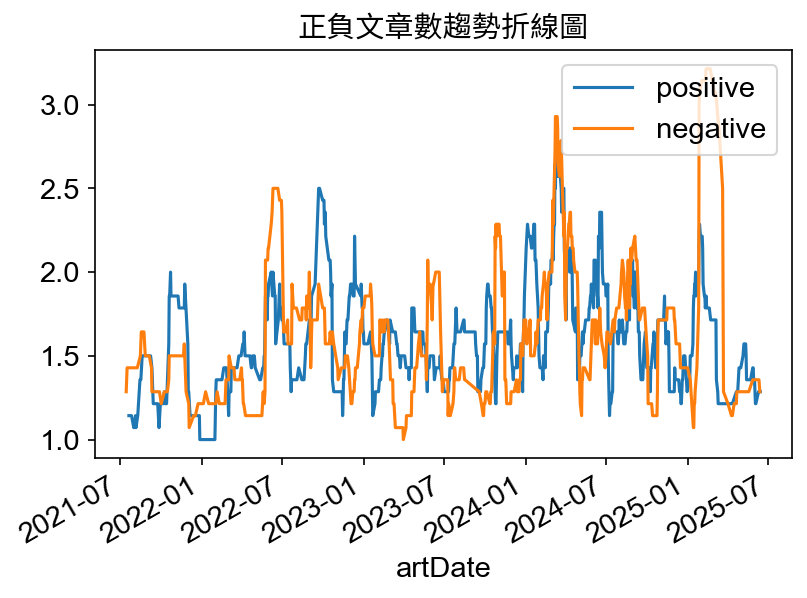

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_art_count[sentiment_art_count["sentiment_class"] == "正向"]
neg = sentiment_art_count[sentiment_art_count["sentiment_class"] == "負向"]

# fig, ax = plt.subplots(figsize = (6,4), dpi = 150) # 也可以在該圖設定參數
fig, ax = plt.subplots()

# 使用 Series.rolling().mean() 來產生 14 天平均
rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[1])
# ax.plot(pos["artDate"], pos['size'], color=colors[0])
# ax.plot(neg["artDate"], neg["size"], color=colors[1])

plt.xlabel("artDate")
# plt.ylabel('size')
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負文章數趨勢折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

在電動車相關的討論中，可以觀察到正負向情緒皆有出現，顯示網友對此議題的看法較為多元。

雖然 2025 年出現明顯的負向文章數上升趨勢，顯示當時可能有爭議或失望事件引發討論，但從情緒詞頻、分數與比例圖來看，整體情緒表達仍偏向正面。這可能表示當時雖有較多負向回應，但多為語氣較溫和的批評，未構成強烈的情緒衝擊。

### 6. 情緒代表字

In [ ]:
word_count = ptt_liwc_df.groupby(["word", "sentiments"]).size().reset_index()
word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

word_count.head(10)

,word,sentiments,size
393,問題,affect,934
394,問題,negative,934
547,安全,affect,201
548,安全,positive,201
241,分享,affect,182
242,分享,positive,182
406,喜歡,positive,179
405,喜歡,affect,179
1415,簡單,positive,166
1414,簡單,affect,166


6.1. 正向詞彙。

In [ ]:
word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_pos.head(15)

,word,sentiments,size
548,安全,positive,201
242,分享,positive,182
406,喜歡,positive,179
1415,簡單,positive,166
610,希望,positive,165
64,不錯,positive,158
1588,解決,positive,136
1729,重要,positive,136
1030,朋友,positive,126
189,優勢,positive,123


6.2. 負向詞彙。

In [ ]:
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]
word_of_neg.head(15)

,word,sentiments,size
394,問題,negative,934
1220,焦慮,negative,136
1476,缺點,negative,120
1757,降低,negative,114
937,擔心,negative,98
1809,風險,negative,88
905,控制,negative,80
1853,麻煩,negative,72
1768,隨便,negative,70
1379,禁止,negative,64


6.3. 正負向詞彙數量長條圖。

/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/391454114.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/391454114.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

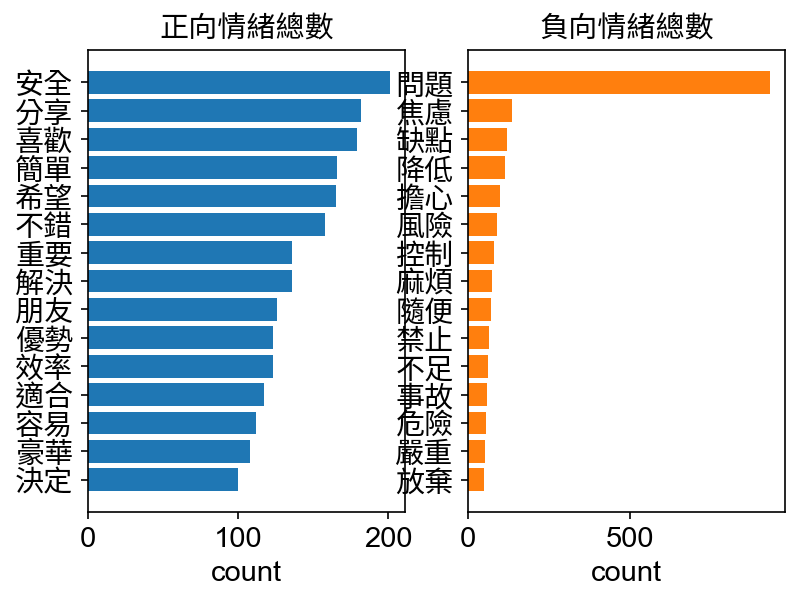

In [ ]:
pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

fig, ax = plt.subplots(1, 2)

ax[0].barh(pos["word"], pos["size"], color=colors[0])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[1])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

正向情緒字：

- 分享：經驗分享、貼文標題、乘車經驗
- 喜歡、不錯：乘車體驗時，對哪些零件、設置感到滿意
- 簡單：是用戶在討論以技術上來說，電池的耗損計算方式
- 希望：對未來電動車，有許多技術上提升的期待
- 重要：對用戶來說重視的賣點、車廠宣稱這次的新品的賣點等
- 豪華：車種、豪華的車廠、豪華的內部娛樂設備

負向情緒字：
- 對於電動車的風險、隱私問題、控制安全性、電池穩定度等問題與隱憂

將有疑問的詞彙抓出來查看其相關文章。

In [ ]:
filtered_df = sent_df[sent_df['sentence'].str.contains('控制', na=False)]
filtered_df.head()

,system_id,artUrl,artTitle,artDate,artContent,sentence,sentiment_class
742,79,https://www.ptt.cc/bbs/car/M.1626225134.A.DD0....,Re:[新聞]換個冷媒大進步！大金宣稱可增加50%續航,2021-07-14,我不是針對誰，我是說，在座的各位文組，都是低能。\n\n電動車的里程電耗基本上蠻穩定的。因為...,高級一點有變頻控制也不是什麼高科技,負向
1125,98,https://www.ptt.cc/bbs/car/M.1626678536.A.E23....,[心得]RX300,2021-07-19,好不容易放假了\n把拖了數月的心得文補上\n當然騙P幣才是重點\n\n\n告別柳營 踏入社會...,預計總成本控制在年收內,正向
1817,172,https://www.ptt.cc/bbs/car/M.1629145718.A.FB1....,[新聞]美國當局就特斯拉「輔助駕駛系統」展開,2021-08-17,美國當局就特斯拉「輔助駕駛系統」 展開正式調查\n\nETTODAY\n\n2021年08月...,其中特斯拉在使用Autopilot系統或交通感知巡航控制系統Traffic Aware Cr...,負向
2301,217,https://www.ptt.cc/bbs/car/M.1630654506.A.9AF....,[心得]特斯拉M3四萬中壢李姓車主心得,2021-09-03,我是2020 3月大約第三批交車的車主，買長程版顏色是窮人白，平均一個月開2000-2500...,3k換過控制椅子位子的零件被我踢斷,正向
2431,224,https://www.ptt.cc/bbs/car/M.1630908896.A.A09....,Re:[問題]為何德國甘願自廢武功挺電動車?,2021-09-06,你這觀點太瞎\n什麼電動車就靠電池\n其它沒惹\n\n電動還是有很多\n需要傳統車廠的技術\...,可以獨立控制的話,正向


In [ ]:
for sentence in filtered_df['sentence'].to_list():
    print(sentence)
    print("=========================")

高級一點有變頻控制也不是什麼高科技
預計總成本控制在年收內
其中特斯拉在使用Autopilot系統或交通感知巡航控制系統Traffic Aware Cruise
3k換過控制椅子位子的零件被我踢斷
可以獨立控制的話
憑藉高性能電驅與先進動態控制技術
看新聞鴻海應該是沒什麼投資在電池控制技術上
看地區還有地方城市的增容稅約15控制城市內的汽車數量
而且控制人民擁有私家車的方式也不是只有單價
控制在175已經是極限
例如雨刷速度空調這些常用功能不易控制
但大概第一次開10分鐘以後就可以好好控制了
不像油車的氧化劑是借助空氣的氧較好控制
  AutoPilot AP 自動控制速度  自動沿著車道行駛
 加減速控制的非常出色
大大提到的煞車跟油門控制
結果反而不好控制
但現在世界各國政府都想轉型電動車控制碳排
控制放水發電
我覺得控制電門也是純粹人車溝通管道啊
因為馬達溫度完全可以控制在非常低的程度
而且車上的馬達控制也不會是靠理論上計算Motor I2T來做馬達保護
開始進入弱磁控制區
但內裝的控制介面很直覺
駕駛去控制檔位
一種有很強控制慾的想法
操作的過程就是將前進與煞車交給車子自己來控制
充電設定來控制
以取得在漢堡港的物流中心控制權
化控制介面
控制火勢
我絕不承認租了幾次高爾夫到現在還是搞不懂大眾那個傳統圓盤控制燈光的使用方式
人家車廠都說用自動駕駛時請保持握住方向盤盯著道路以防需要緊急切換人工控制
語音控制常用就調空調溫度跟風扇開關天窗遮陽蓬
控制不常用
他在山路過彎的速度控制上我甚至覺得超越大多數的人
因為我不用100看著前面控制方向盤控制電門跟煞車
磁體技術改進核融合裝置中使用大型磁體來控制和限制等離子體
但是電門還是很好控制不會爆衝
而且右腳其實控制要更精細
讓車維作動但速度我自己控制比較舒服
車廠要同時控制成本與產品及早上市
而Rivian則面臨製造品質和氣候控制功能等方面的挑戰
進到車機裡面控制容易分心
業務當場秀語音控制給
特斯拉品質控制問題
該軟體不受控制
那如何控制火勢
廠商利用軟體電池維修的套路控制消費者換機週期
不包含電池控制系統如電腦電路板等
Cybertruck 品質控制
代工教母怎不用全力去阻擋日產喪權辱國的控制
遠端控制中心
進一步整合車輛控制和娛樂系統
也就是建廠房擴大產線以及成本控制
車身沒有即時控制住
夠龜 成本控制技巧夠好產

「隨便」、「控制」等的情緒有正面也有負面的，所以我們將它們移除後再重新計算情緒。

In [ ]:
# 設定要移除的字詞列表
words_to_remove = ['控制','隨便']
# 使用 ~ 運算子和 isin() 方法過濾掉包含在 words_to_remove 列表中的行
liwc_dict_revise = liwc_dict[~liwc_dict['word'].isin(words_to_remove)]
# 使用更新後的情緒字典 merge
ptt_liwc_df_revise = pd.merge(nostop_df_updated[["artUrl", "artDate", "artTitle", "artContent","word"]], liwc_dict_revise, how="left")
ptt_liwc_df_revise.head()

,artUrl,artDate,artTitle,artContent,word,sentiments
0,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教,NaN
1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車,NaN
2,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上,NaN
3,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,標線,NaN
4,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,辨識,NaN


6.4. 重新繪製長條圖。

/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/2708770589.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
/var/folders/t3/8gvdpyx92m196npgpq1v2_5w0000gn/T/ipykernel_41941/2708770589.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

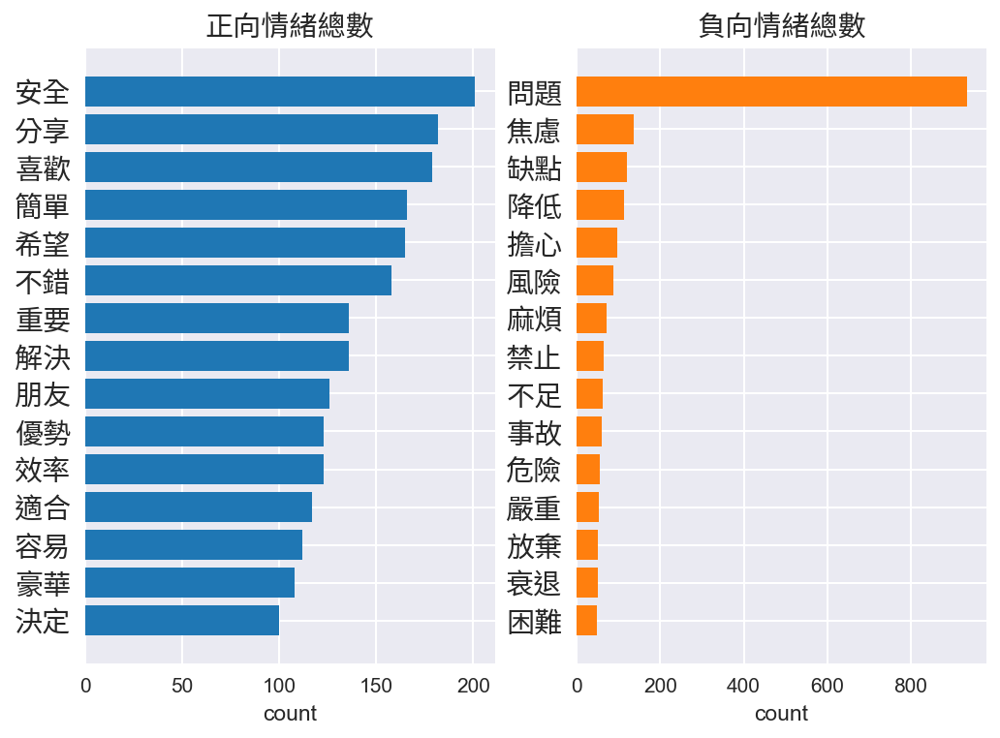

In [ ]:
word_count = ptt_liwc_df_revise.groupby(["word", "sentiments"]).size().reset_index()

word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)

word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]

pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

fig, ax = plt.subplots(1, 2)

ax[0].barh(pos["word"], pos["size"], color=colors[0])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[1])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

重新繪製情緒趨勢圖。

Text(0.5, 1.0, '正負情緒分數趨勢折線圖')

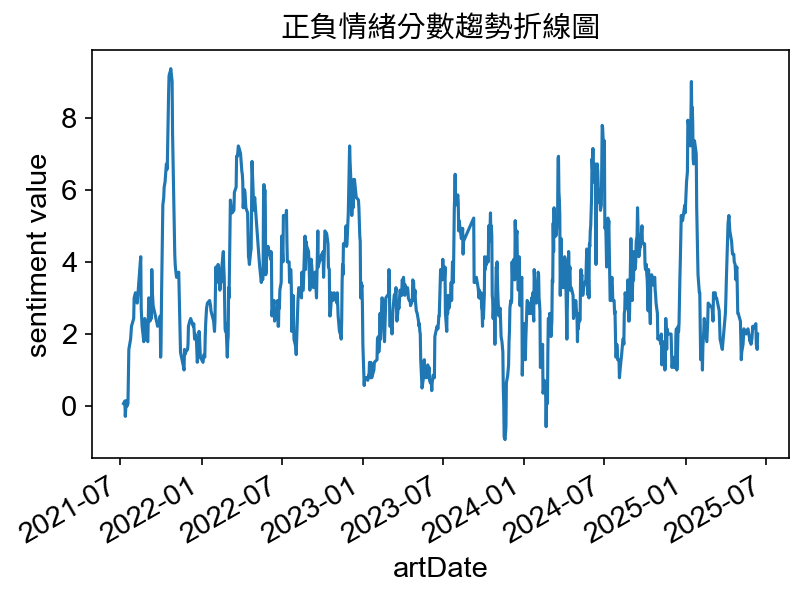

In [ ]:
sentiment_count_revise = pd.DataFrame(
    ptt_liwc_df_revise.groupby(["artDate", "sentiments"]).size()
).reset_index()

mask = (sentiment_count_revise['sentiments'] == "positive") | (sentiment_count_revise['sentiments'] == "negative")
sentiment_count_revise = sentiment_count_revise.loc[mask]

sentiment_count_revise = sentiment_count_revise.rename(columns={0: "size"})
sentiment_count_revise = sentiment_count_revise.sort_values(["artDate"])

ptt_sentiment_value_revise = (
    sentiment_count_revise.pivot_table(
        index="artDate", columns="sentiments", values="size", fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)

# sentiment 計算方式: positive - negative
ptt_sentiment_value_revise["sentiment_value"] = (
    ptt_sentiment_value_revise["positive"]
    - ptt_sentiment_value_revise["negative"]
)

# 繪製情緒分數趨勢圖
fig, ax = plt.subplots()

rolling_days = 14
ax.plot(ptt_sentiment_value_revise["artDate"], ptt_sentiment_value_revise["sentiment_value"].rolling(rolling_days).mean())
ax.set_xlabel("artDate")
ax.set_ylabel("sentiment value")
fig.autofmt_xdate()
plt.title("正負情緒分數趨勢折線圖", fontproperties=fprop)

### 7. 利用文字雲看2023/07/01~2023/12/31情緒分數降低的關鍵字

In [ ]:
ptt_liwc_df_revise = pd.merge(ptt_liwc_df_revise, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
ptt_liwc_df_revise.head()

,artUrl,artDate,artTitle,artContent,word,sentiments,sentiment_class
0,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,請教,NaN,NaN
1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,新車,NaN,NaN
2,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,地上,NaN,NaN
3,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,標線,NaN,NaN
4,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,2021-06-14,[問題]電動車具備標線辨識功能嗎？,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,辨識,NaN,NaN


將資料集和情緒資料合併。

In [ ]:
sent_df = pd.merge(sent_df, ptt_sentiment_value_by_article[['artUrl', 'sentiment_class']], how="left")
sent_df["artDate"] = pd.to_datetime(sent_df["artDate"])
sent_df['artDate'] = sent_df['artDate'].dt.date
sent_df.head()

,system_id,artUrl,artTitle,artDate,artContent,sentence,sentiment_class
0,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,想請教大大們,NaN
1,1,https://www.ptt.cc/bbs/car/M.1623600400.A.CC0....,[問題]電動車具備標線辨識功能嗎？,2021-06-14,想請教大大們\n\n目前的新車 對於地上標線的辨識 會提醒駕駛嗎？\n\n因為看到最新的奧迪...,目前的新車 對於地上標線的辨識 會提醒駕駛嗎,NaN
2,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,感謝版主審查後同意發文,正向
3,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,大家好,正向
4,2,https://www.ptt.cc/bbs/car/M.1623724214.A.A91....,[問卷]電動車車主駕駛經驗問卷調查,2021-06-15,*感謝版主審查後同意發文*\n\n\n大家好，我們是國泰金控數位數據暨科技發展中心；這裡有份...,我們是國泰金控數位數據暨科技發展中心這裡有份問卷想了解電動車車主駕,正向


在這期間的負向相關詞彙。

In [ ]:
date = "2023-07-01"
end_date = "2023-12-31"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")

ptt_df_wc = ptt_liwc_df_revise.loc[mask]
ptt_df_wc.head(10)

,artUrl,artDate,artTitle,artContent,word,sentiments,sentiment_class
85166,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,小咖,NaN,負向
85167,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,car,NaN,負向
85168,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,發言,NaN,負向
85169,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,論壇,NaN,負向
85170,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,討論區,NaN,負向
85171,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,插一句,NaN,負向
85172,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,觸控,NaN,負向
85173,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,設計,NaN,負向
85174,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,2013,NaN,負向
85175,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,2023-07-01,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,紐約,NaN,負向


In [ ]:
date = "2023-07-01"
end_date = "2023-12-31"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")

ptt_df_wc = ptt_liwc_df_revise.loc[mask, ["artDate", "word"]]


word_count_count = pd.DataFrame(
    ptt_df_wc.groupby(["word"]).size()
).reset_index().rename(columns={0: "size"})

word_count_count = word_count_count.sort_values(by='size', ascending=False)
word_count_count.head(10)

,word,size
1410,問題,216
983,充電,105
2977,特斯拉,104
4398,電池,78
1324,台灣,65
2771,汽車,63
3786,豐田,58
2809,油車,46
2007,快充,45
853,使用,44


(-0.5, 1599.5, 799.5, -0.5)

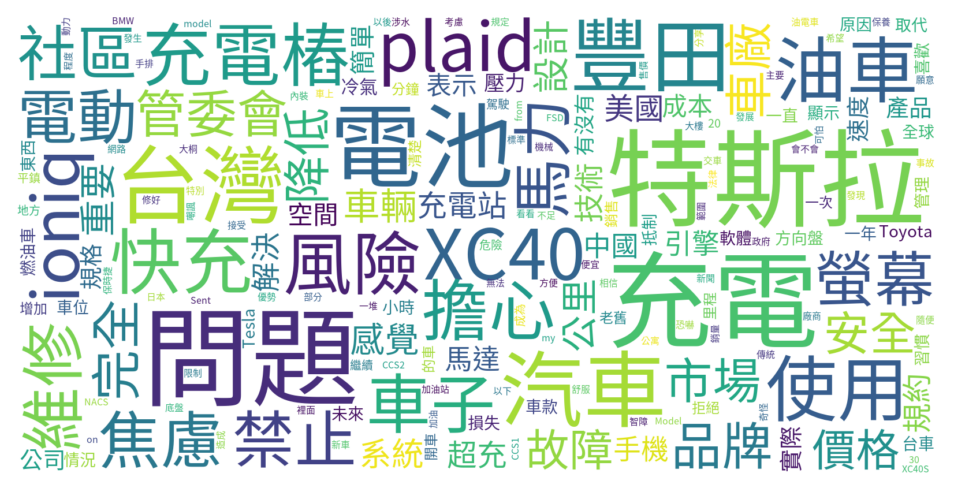

In [ ]:
# wordcloud 的 input 是 dictionary
font_path = "./raw_data/SourceHanSansTW-Regular.otf"  # 中文字型路徑
wc_dict = dict(zip(word_count_count['word'], word_count_count['size']))
cloud1 = WordCloud(scale = 4, max_words=200, background_color="white", font_path=font_path)
cloud1.generate_from_frequencies(wc_dict)
# 繪圖
plt.figure(figsize=(8, 4), dpi=150)
plt.imshow(cloud1, interpolation="bilinear")
plt.axis("off")

在關鍵字中出現了「特斯拉」相關詞彙，顯示這段期間出現了與特斯拉有關的負面文章。

接著我們深入去查看有關「特斯拉」的負面文章有哪些相關詞彙。

(-0.5, 1599.5, 799.5, -0.5)

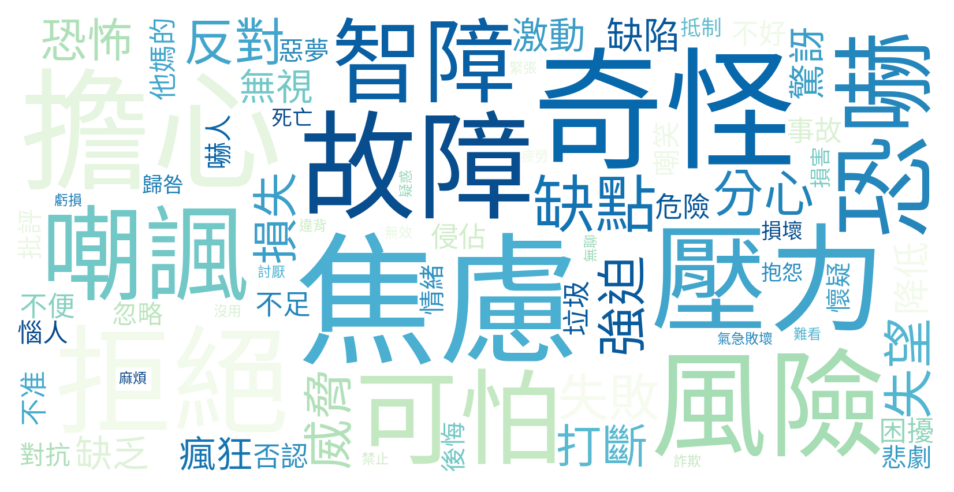

In [ ]:
date = "2023-07-01"
end_date = "2023-12-31"
mask = (ptt_liwc_df_revise['artDate'] >= pd.Timestamp(date).date()) & (
    ptt_liwc_df_revise['artDate'] <= pd.Timestamp(end_date).date()) & (
    ptt_liwc_df_revise['sentiment_class'] == "負向")  & (
    ptt_liwc_df_revise['artContent'].str.contains('特斯拉')) & (
    ptt_liwc_df_revise["sentiments"] == "negative")

ptt_df_wc = ptt_liwc_df_revise.loc[mask, ["artDate", "word"]]
wc = ptt_df_wc.groupby(["word"]).size().to_dict()

# wordcloud 的 input 是 dictionary
cloud = WordCloud(scale = 4, max_words=200, background_color="white", font_path=font_path, colormap="GnBu")
cloud.generate_from_frequencies(wc)
# 繪圖
plt.figure(figsize=(8, 4), dpi=150)
plt.imshow(
    cloud,
    interpolation="bilinear"
)
plt.axis("off")

情緒用字：對於特斯拉的政策、與政府合作的方針、硬件的設置

最後，我們將負面詞彙設為「風險」，來看文章都說些什麼。

In [ ]:
date = "2021-05-15"
end_date = "2021-09-15"
mask = (sent_df['artDate'] >= pd.Timestamp(date).date()) & (
    sent_df['artDate'] <= pd.Timestamp(end_date).date()) & (
    sent_df['sentiment_class'] == "負向") & (
    sent_df['artContent'].str.contains('特斯拉')) & (
    sent_df['sentence'].str.contains('風險'))

df_ = sent_df.loc[mask, ["artDate", "artContent", "sentence"]]
index_list = df_.index.tolist()


# 取得前後各5筆的索引 => 目的為查看包含該詞彙句子的上下文
surrounding_indices = []
for index in index_list:
    surrounding_indices.extend(range(index - 5, index + 6))

# 去除重複的索引，並確保不超出範圍
surrounding_indices = list(set(filter(lambda x: x >= 0 and x < len(sent_df), surrounding_indices)))

# 依據索引取得相應的資料
result_df = sent_df.iloc[surrounding_indices].sort_index()
result_df[['artTitle', 'sentence', 'sentiment_class']]

,artTitle,sentence,sentiment_class
189,[分享]德州特斯拉電動車ModelS火災,輛消防車就夠了,負向
190,[分享]德州特斯拉電動車ModelS火災,最後,負向
191,[分享]德州特斯拉電動車ModelS火災,拖吊卡車移置電動車殘骸時,負向
192,[分享]德州特斯拉電動車ModelS火災,電池又起火兩次,負向
193,[分享]德州特斯拉電動車ModelS火災,這是電動車時代來臨時,負向
194,[分享]德州特斯拉電動車ModelS火災,很多人沒看到的風險,負向
195,[分享]德州特斯拉電動車ModelS火災,而昨天,負向
196,[分享]德州特斯拉電動車ModelS火災,另一個電動車大國中國,負向
197,[分享]德州特斯拉電動車ModelS火災,也發生了一樣的事情,負向
198,[分享]德州特斯拉電動車ModelS火災,一個電瓶車停車場發生了火災,負向


可以從文章及文字雲中發現，網友覺得特斯拉可能存在電池相關問題的風險。

## 8. 使用 snowNLP 進行情緒分析

### 8.1 使用snowNLP

使用snowNLP來進行情緒分析。

In [ ]:
from snownlp import SnowNLP

我們將「特斯拉」設為關鍵詞，以便與上方的情緒分析1進行比較。

In [ ]:
keyword_list = ['特斯拉']
car_selected = df[df['artContent'].str.contains('|'.join(keyword_list),regex=True)]
print(f"{' '.join(keyword_list)}：{car_selected.shape[0]}篇相關貼文")
car_selected.head(3)

特斯拉：1092篇相關貼文


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
11,12,https://www.ptt.cc/bbs/car/M.1624174816.A.8F7....,[問題]為什麼電動車功率都要做這麼大？,2021-06-20 15:40:14,kashima228,car,特斯拉 等等的電動車\n馬達功率都做的很大\n說是比油車大排氣還大\n\n不是會有里程不足的...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""DYE"", ""cmtCo...",61.71.123.77,2021-06-21 00:05:00,ptt
14,15,https://www.ptt.cc/bbs/car/M.1624244495.A.4BF....,Re:[問題]為什麼電動車功率都要做這麼大？,2021-06-21 11:01:33,francej,car,:\n:\n:\n:\n:\n\n你會買一台 150萬台幣 續航力400公里 加速11...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""RichardHan"",...",111.249.77.33,2021-06-22 00:04:49,ptt
15,16,https://www.ptt.cc/bbs/car/M.1624259383.A.BCB....,[新聞]電動車車禍火警救火所需消防人力和用水,2021-06-21 15:09:39,d8613518,car,原文連結：\nhttps://4fun.tw/vDzs\n原文內容：\n\n經濟日報 編譯季...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""ccc101419"", ...",27.247.69.223,2021-06-22 00:04:49,ptt


In [ ]:
sentence_table = sent_df[['system_id','sentence']]
sentence_table

,system_id,sentence
0,1,想請教大大們
1,1,目前的新車 對於地上標線的辨識 會提醒駕駛嗎
2,2,感謝版主審查後同意發文
3,2,大家好
4,2,我們是國泰金控數位數據暨科技發展中心這裡有份問卷想了解電動車車主駕
...,...,...
56540,3977,總價含保
56541,3977,險也壓在100萬內
56542,3977,供大家參考
56543,3978,川普宣稱正在拯救美國汽車業 正式簽署美國會通過法案不讓加州阻止燃油車販售


In [ ]:
sentiment_date = pd.merge(sentence_table,car_selected[['system_id','artDate','dataSource']],on='system_id',how='left').dropna()
sentiment_date.head(3)

,system_id,sentence,artDate,dataSource
81,12,特斯拉 等等的電動車,2021-06-20 15:40:14,ptt
82,12,馬達功率都做的很大,2021-06-20 15:40:14,ptt
83,12,說是比油車大排氣還大,2021-06-20 15:40:14,ptt


In [ ]:
def get_sentiment(sent):
    s = SnowNLP(sent)
    return s.sentiments

# 幫每句話加上情緒分數
sentiment_date['sentimentValue'] = sentiment_date.apply(lambda row : get_sentiment(row['sentence'],), axis = 1)
sentiment_date.head(3)

,system_id,sentence,artDate,dataSource,sentimentValue
81,12,特斯拉 等等的電動車,2021-06-20 15:40:14,ptt,0.718631
82,12,馬達功率都做的很大,2021-06-20 15:40:14,ptt,0.889349
83,12,說是比油車大排氣還大,2021-06-20 15:40:14,ptt,0.101962


In [ ]:
# 看一下情緒的分布
sentiment_date['sentimentValue'].describe()

count    1.714100e+04
mean     4.132901e-01
std      3.009453e-01
min      3.187867e-07
25%      1.301725e-01
50%      3.946382e-01
75%      6.430996e-01
max      9.999986e-01
Name: sentimentValue, dtype: float64

In [ ]:
sent_date = sentiment_date.copy()
sent_date['artDate'] =  pd.to_datetime(sentiment_date['artDate']).dt.to_period('M')

sentiment_count = sent_date.groupby(['artDate'])['sentimentValue'].mean().reset_index()
sentiment_count

,artDate,sentimentValue
0,2021-06,0.429465
1,2021-07,0.452980
2,2021-08,0.392221
3,2021-09,0.379651
4,2021-10,0.412095
5,2021-11,0.393871
6,2021-12,0.379060
7,2022-01,0.420331
8,2022-02,0.422568
9,2022-03,0.409352


平均情緒分數時間趨勢。

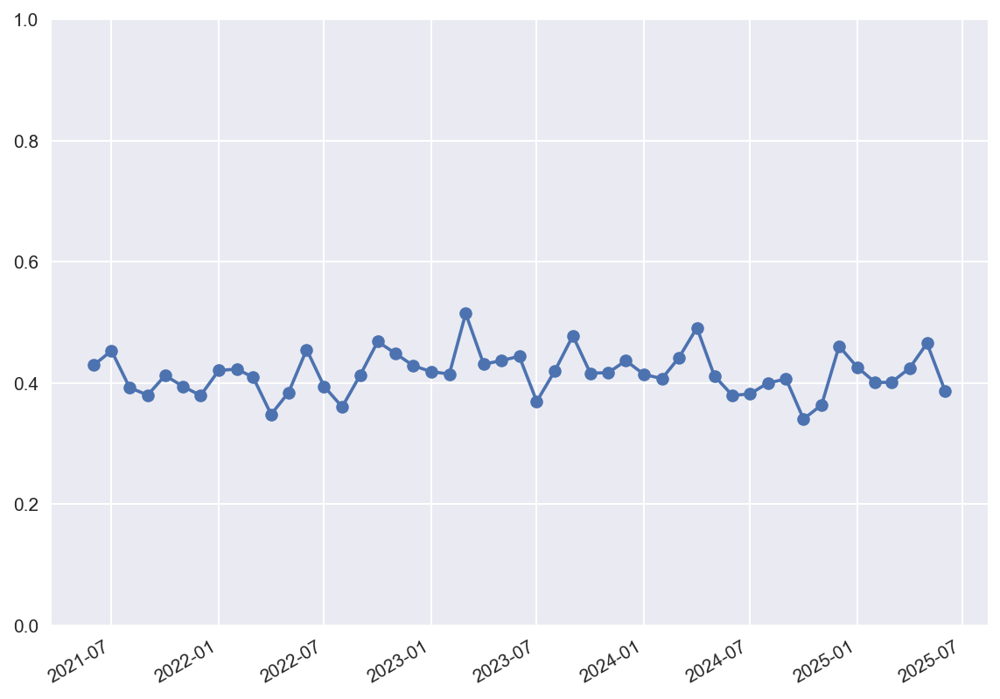

In [ ]:
months = [period.to_timestamp() for period in sentiment_count['artDate']]   # 將 PeriodIndex 中的每個 Period 物件轉換為對應的 datetime 物件
y = sentiment_count['sentimentValue']

plt.style.use('seaborn-v0_8')

plt.plot_date(months, y, linestyle='solid')
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.ylim(0, 1)

plt.show()

從結果來看，情緒值大多維持在 0.3 至 0.5 之間，顯示關於「特斯拉」的文章整體情緒偏向中下。

### 8.2 詞彙探索
根據情緒分析1的結果，特斯拉相關文章在 2023-07-01 至 2023-12-31 期間出現較多負向情緒。

因此，我們也篩選出該期間的句子，進一步使用 SnowNLP 方法進行情緒分析，觀察兩者結果是否有所差異。

In [ ]:
# 篩時間
start_date = "2023-07-01"
end_date = "2023-12-31"

filter_sentiment = sent_date[
    (sent_date['artDate'] >= start_date) &
    (sent_date['artDate'] <= end_date) &
    (sent_date['sentimentValue'] < 0.4)
]

filter_sentiment.head()

,system_id,sentence,artDate,dataSource,sentimentValue
24229,1898,是這樣啦 我只是小咖 也基本沒在car版發言,2023-07,ptt,0.004866
24230,1898,但是在其他論壇討論區只要插一句嘴我都是在罵觸控設計,2023-07,ptt,0.258918
24232,1898,身為一個97年開始開車,2023-07,ptt,0.055213
24234,1898,我是堅決反對智能化及大螢幕放在車上,2023-07,ptt,0.221069
24235,1898,我也不敢說依老賣老,2023-07,ptt,0.133906


斷詞

In [ ]:
filter_sentiment_word = sent_df.assign(word = filter_sentiment['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

filter_sentiment_word = filter_sentiment_word.dropna(subset=['word'])

filter_sentiment_word = filter_sentiment_word.loc[filter_sentiment_word['word'].str.len() > 1]

filter_sentiment_word.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentiment_class,word
24229,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,這樣
24229,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,只是
24229,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,小咖
24229,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,基本
24229,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,car
24229,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,發言
24230,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,但是
24230,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,論壇
24230,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,討論區
24230,1898,https://www.ptt.cc/bbs/car/M.1688153041.A.5F1....,Re:[新聞]VWCEO承認車廂用大量觸控設計失敗未來,2023-07-01,是這樣啦 我只是小咖 也基本沒在car版發言\n但是在其他論壇討論區只要插一句嘴我都是在罵觸...,負向,只要


清理停用字

In [ ]:
filter_sentiment_word_noStop = filter_sentiment_word[~filter_sentiment_word['word'].isin(stopwords)]

文字雲

In [ ]:
filter_sentiment_word_freq = pd.DataFrame(filter_sentiment_word_noStop['word'].value_counts()).sort_values(by = ['count'], ascending = False).reset_index()

# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
filter_sentiment_word_freq_dict = filter_sentiment_word_freq.set_index('word').to_dict()
filter_sentiment_word_freq_dict = filter_sentiment_word_freq_dict['count']

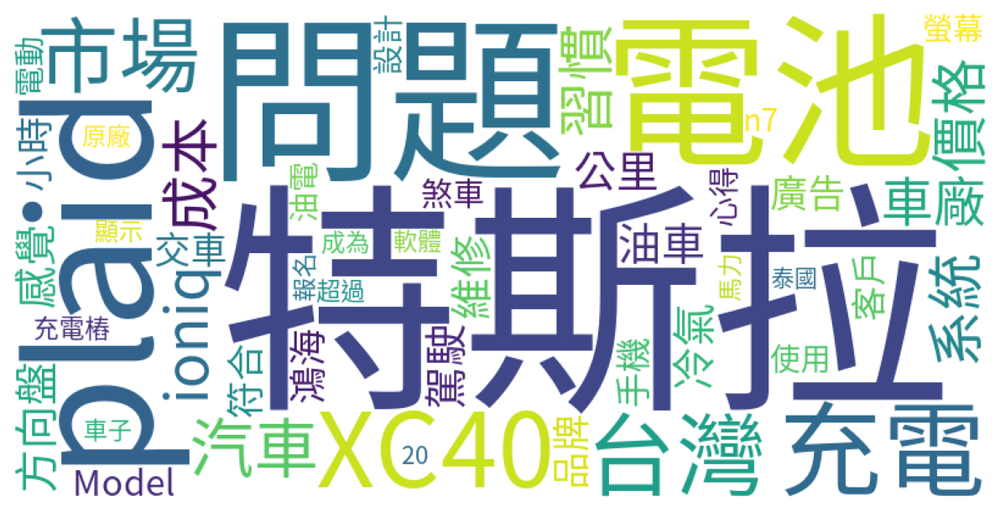

In [ ]:
# 繪製文字雲
filter_sentiment_word_wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
filter_sentiment_word_wordcloud.generate_from_frequencies(filter_sentiment_word_freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(filter_sentiment_word_wordcloud)
plt.axis('off')
plt.show()

最後，我們將方法1（LIWC辭典）和方法2（SnowNLP）所輸出的文字雲進行比較。

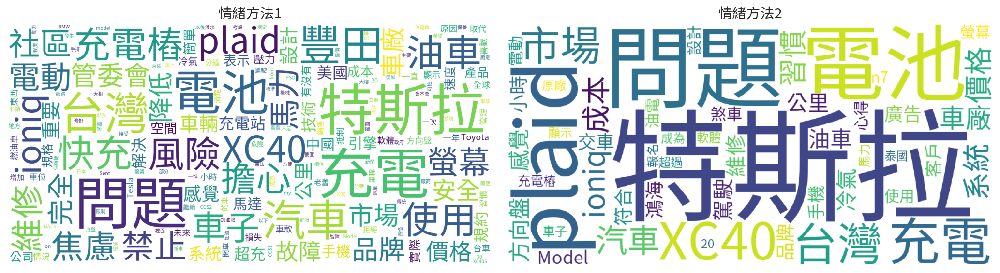

In [ ]:
from matplotlib.font_manager import FontProperties

font_path = FontPath
zh_font = FontProperties(fname=font_path)

plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.imshow(cloud1)
plt.axis('off')
plt.title("情緒方法1（LIWC辭典）", fontproperties=zh_font)

plt.subplot(1, 2, 2)
plt.imshow(filter_sentiment_word_wordcloud)
plt.axis('off')
plt.title("情緒方法2（SnowNLP 方法）", fontproperties=zh_font)

plt.tight_layout()
plt.show()


從結果可以發現，兩個文字雲所出現的詞彙相似度滿高的，像是「plaid」、「電池」、「問題」、「充電」、「XC40」等...

從網路上的資訊可見，不少車主對「特斯拉 Plaid」的電池表現抱持負面看法，這與我們從文字雲中提取的情緒趨勢相符。

# 三、主題建模：
- 我們將透過 LDA 、GuidedLDA、LLM 進行主題建模，以查看可能的主題結果：
  - LDA 建模
  - GuidedLDA 建模
  - LLM 建模

## 1.套件+資料前處理1
本次實作過程中使用到的相關套件，在課堂中我們將會簡單的展示這些套件的使用方式，關於各個套件的進階使用請同學參照其官網的說明。
+ gensim: 主題模型函式庫
+ pyLDAvis: 互動式LDA視覺化套件

In [ ]:
!pip install \
ckiptagger==0.2.1 \
gdown==5.1.0 \
gensim==4.3.3 \
huggingface-hub==0.25.1 \
jieba==0.42.1 \
jupyter==1.1.1 \
keras==2.15.0 \
matplotlib==3.8.2 \
nltk==3.8.1 \
numpy==1.24.3 \
pandas==2.2.2 \
pyLDAvis==3.4.1 \
scikit-learn==1.4.0 \
scipy==1.12.0 \
seaborn==0.13.2 \
snownlp==0.12.3 \
stanza==1.10.1 \
tensorflow==2.15.0 \
textblob==0.17.0 \
torch==2.4.1 \
vaderSentiment==3.3.2 \
wordcloud==1.9.3


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 14.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 68.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 436.4/436.4 kB 35.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 80.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 116.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 82.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 109.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 92.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 112.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━

In [ ]:
import time
from functools import reduce
from collections import Counter
from pprint import pprint

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import jieba
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from gensim.corpora import Dictionary
from gensim.models import LdaModel, CoherenceModel
from gensim.models.ldamulticore import LdaMulticore
from gensim.matutils import corpus2csc, corpus2dense, Sparse2Corpus

import pyLDAvis
import pyLDAvis.gensim_models

In [ ]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [ ]:
# 設定中文字體
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms'] #使圖中中文能正常顯示
plt.rcParams['axes.unicode_minus'] = False #使負號能夠顯示

In [ ]:
# 初始化斷詞引擎：不一定要設定，只使用內建效果也可以
jieba.set_dictionary('dict.txt')

# 載入自定義辭典：一個詞一行，每行分詞語、詞頻(可省)、詞性(可省)
jieba.load_userdict('user_dict.txt')

Building prefix dict from /content/dict.txt ...
DEBUG:jieba:Building prefix dict from /content/dict.txt ...
Loading model from cache /tmp/jieba.ueb620ec8402181953a0299d7957c0d6e.cache
DEBUG:jieba:Loading model from cache /tmp/jieba.ueb620ec8402181953a0299d7957c0d6e.cache
Loading model cost 0.589 seconds.
DEBUG:jieba:Loading model cost 0.589 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


In [ ]:
df = pd.read_csv('ptt_car_2025.csv')
df.head()

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,csgod1325,car,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""sbax8186"", ""...",111.246.199.70,2025-01-03 1:01:40,ptt
1,3641,https://www.ptt.cc/bbs/car/M.1735793069.A.B8F....,[新聞]2024台灣最暢銷10款新車「TOYOTA神車再破,2025-01-02 12:44:27,mingtingC,car,2024台灣最暢銷10款新車「TOYOTA神車再破3萬輛」！特斯拉成最賣電車\n\n記者張慶...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""maniaque"", ""...",223.136.115.35,2025-01-03 1:01:43,ptt
2,3642,https://www.ptt.cc/bbs/car/M.1735896595.A.EF5....,Re:[心得]電動車大電池原廠保固的真相(12/6更新),2025-01-03 17:29:53,Dogmahan,car,趁著昨天回VW的時候問了一下接待\n\n簡單來說，因為MEB平台是模組化的電池設計\n如果遇...,"[{""cmtStatus"": ""噓"", ""cmtPoster"": ""AMSTERDAM14""...",49.216.25.244,2025-01-04 1:01:48,ptt
3,3643,https://www.ptt.cc/bbs/car/M.1735896713.A.A07....,[新聞]台灣大哥大MyCharge進駐13家好市多,2025-01-03 17:31:51,tvdefeld,car,台灣大哥大MyCharge進駐13家好市多 全台充電樁逾400座\n024.12.30 1...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""n74042300"", ...",114.136.249.95,2025-01-04 1:01:48,ptt
4,3644,https://www.ptt.cc/bbs/car/M.1735902293.A.5EB....,[新聞]特斯拉2024年交車衰退，台系供應鏈有感,2025-01-03 19:04:51,maniaque,car,[來源]\nhttps://reurl.cc/6jbaMZ\n[新聞]\n\n特斯拉2024...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""JOHNJJ"", ""cm...",116.89.128.171,2025-01-04 1:01:48,ptt


In [ ]:
import jieba.analyse
import re

In [ ]:
clear_df = df.copy()

#去除不會用到的欄位
drop_cols = ['artPoster','artComment', 'insertedDate', 'dataSource', 'artCatagory', 'e_ip']
clear_df.drop(drop_cols, axis = 1, inplace = True)

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)
clear_df.dropna(subset = ['artTitle'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','，', regex=True)

# 移除網址格式
clear_df["artContent"] = clear_df.artContent.apply(
    lambda x: re.sub("(http|https)://.*", "", x)
)
clear_df["sentence"] = clear_df["sentence"].apply(
    lambda x: re.sub("(http|https)://.*", "", x)
)
clear_df["artTitle"] = clear_df["artTitle"].apply(
    lambda x: re.sub("(http|https)://.*", "", x)
)

clear_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,如題，台灣擁有全世界最貴的電動車價格，以2023 年Model Y 為例，世界各國都200萬...
1,3641,https://www.ptt.cc/bbs/car/M.1735793069.A.B8F....,[新聞]2024台灣最暢銷10款新車「TOYOTA神車再破,2025-01-02 12:44:27,2024台灣最暢銷10款新車「TOYOTA神車再破3萬輛」！特斯拉成最賣電車\n\n記者張慶...,2024台灣最暢銷10款新車「TOYOTA神車再破3萬輛」！特斯拉成最賣電車。記者張慶輝／綜...
2,3642,https://www.ptt.cc/bbs/car/M.1735896595.A.EF5....,Re:[心得]電動車大電池原廠保固的真相(12/6更新),2025-01-03 17:29:53,趁著昨天回VW的時候問了一下接待\n\n簡單來說，因為MEB平台是模組化的電池設計\n如果遇...,趁著昨天回VW的時候問了一下接待。簡單來說，因為MEB平台是模組化的電池設計，如果遇到同樣的...
3,3643,https://www.ptt.cc/bbs/car/M.1735896713.A.A07....,[新聞]台灣大哥大MyCharge進駐13家好市多,2025-01-03 17:31:51,台灣大哥大MyCharge進駐13家好市多 全台充電樁逾400座\n024.12.30 1...,台灣大哥大MyCharge進駐13家好市多 全台充電樁逾400座，024.12.30 16...
4,3644,https://www.ptt.cc/bbs/car/M.1735902293.A.5EB....,[新聞]特斯拉2024年交車衰退，台系供應鏈有感,2025-01-03 19:04:51,[來源]\n\n[新聞]\n\n特斯拉2024年交車衰退，台系供應鏈有感\nMoneyDJ新...,[來源]，
5,3645,https://www.ptt.cc/bbs/car/M.1735983572.A.B1A....,[新聞]廣東比亞迪失控撞車瞬間粉碎,2025-01-04 17:39:30,\n【新唐人北京時間2025年01月04日訊】中共大力支持國產電動車，但其質量被指堪憂。廣\...,
6,3646,https://www.ptt.cc/bbs/car/M.1736073736.A.054....,[新聞]小米集團股價創歷史新高,2025-01-05 18:42:13,小米集團股價創歷史新高\n\n經濟日報\n\n2025-01-03 20:33 聯合報 記者...,小米集團股價創歷史新高。經濟日報。2025-01-03 20:33 聯合報 記者林茂仁／即時...
7,3647,https://www.ptt.cc/bbs/car/M.1736102100.A.1F8....,[閒聊]KIAEV6/Mach-E/美國交通心得,2025-01-06 2:34:58,前陣子到加州遊玩的時候\n想說是個機會嘗試不同品牌的電動車\n本身是特車主，絕對是完全偏袒特...,前陣子到加州遊玩的時候，想說是個機會嘗試不同品牌的電動車，本身是特車主，絕對是完全偏袒特，心...
8,3648,https://www.ptt.cc/bbs/car/M.1736127938.A.84E....,[問題]N7到底是成功還是失敗？,2025-01-06 9:45:36,第一輛國產平價電動車\n\n最便宜99萬就有\n\n還要增程版可以選擇\n\n每次都說一年上...,第一輛國產平價電動車。最便宜99萬就有。還要增程版可以選擇。每次都說一年上萬輛。又說增程版訂...
9,3649,https://www.ptt.cc/bbs/car/M.1736137420.A.E8B....,[新聞]史丹佛大學研究電動車電池壽命比預期長,2025-01-06 12:23:37,史丹佛大學研究「電動車電池壽命比預期高40%」！實驗室跟現實有差異\n\nETtoday新聞...,史丹佛大學研究「電動車電池壽命比預期高40%」！實驗室跟現實有差異。ETtoday新聞雲。7...


In [ ]:
clear_df['sentence'] = clear_df['sentence'].str.split("[,，。！!？?]{1,}")

sent_df = clear_df.explode('sentence').reset_index(drop=True)

sent_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,如題
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣擁有全世界最貴的電動車價格
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,以2023 年Model Y 為例
3,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,世界各國都200萬以內的時候
4,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣硬是要賣超過200萬
5,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,2024年底
6,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,中國電動車售價降至25萬人民幣
7,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,約110萬台幣
8,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣目前特斯拉官網
9,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,今年價格更硬了


In [ ]:
# 保留中文字、英數、空白與底線
sent_df['sentence'] = sent_df['sentence'].str.replace(r'[^\u4e00-\u9fa5\w\s]', '', regex=True).astype(str)

# 把長度小於1的sentence刪掉
sent_df = sent_df[sent_df["sentence"].str.len() > 1]

sent_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,如題
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣擁有全世界最貴的電動車價格
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,以2023 年Model Y 為例
3,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,世界各國都200萬以內的時候
4,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣硬是要賣超過200萬
5,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,2024年底
6,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,中國電動車售價降至25萬人民幣
7,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,約110萬台幣
8,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣目前特斯拉官網
9,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,今年價格更硬了


In [ ]:
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 去除空值
word_df = word_df.dropna(subset=['word'])

word_df = word_df.loc[word_df['word'].str.len() > 1]

word_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,word
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,如題
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,擁有
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,全世界
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,最貴
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,電動車
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,價格
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,2023
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,Model
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,為例


In [ ]:
stopwords = [line.strip() for line in open('stopwords.txt', 'r', encoding='utf-8').readlines()]
# 參數形式手動加入停用字
stopwords_manual = ["電動車", "看到", "原文", "時間", "一下", "知道", "不用", "這種", "最近", "電車"
                    , "目前", "直接", "一點", "一台", "之後", "現在", "需要", "最後", "好像", "根本"]
stopwords.extend(stopwords_manual)

noStop_df = word_df[~word_df['word'].isin(stopwords)]
noStop_df.head(10)

,system_id,artUrl,artTitle,artDate,artContent,word
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,如題
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,擁有
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,全世界
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,最貴
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,價格
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,2023
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,Model
2,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,為例
3,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,世界


## 2. 資料前處理2

In [ ]:
udn = noStop_df  # 匯資料
udn.head(3)

,system_id,artUrl,artTitle,artDate,artContent,word
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,如題
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,台灣
1,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 8:50:33,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,擁有


In [ ]:
# 移除網址格式
# 只留下中文字
udn["artContent"] = udn["artContent"].str.replace("(http|https)://.*", "", regex=True)
udn["artContent"] = udn["artContent"].str.replace("[^\u4e00-\u9fa5]+", "", regex=True)
udn['content'] = udn['artContent']


udn = udn.loc[:,["content"]]  # 文章內容 文章連結
udn.head(3)

<ipython-input-19-4122586137>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  udn["artContent"] = udn["artContent"].str.replace("(http|https)://.*", "", regex=True)
<ipython-input-19-4122586137>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  udn["artContent"] = udn["artContent"].str.replace("[^\u4e00-\u9fa5]+", "", regex=True)
<ipython-input-19-4122586137>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

,content
0,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...


In [ ]:
# 設定繁體中文詞庫
jieba.set_dictionary("dict.txt.big")

# 新增stopwords
# jieba.analyse.set_stop_words('./dict/stop_words.txt') #jieba.analyse.extract_tags才會作用
with open("stop_words.txt", encoding="utf-8") as f:
    stopWords = [line.strip() for line in f.readlines()]

# 設定斷詞 function
def getToken(row):
    seg_list = jieba.cut(row, cut_all=False)
    seg_list = [
        w for w in seg_list if w not in stopWords and len(w) > 1
    ]  # 篩選掉停用字與字元數大於1的詞彙
    return seg_list

udn["words"] = udn["content"].apply(getToken)
udn.head()

Building prefix dict from /content/dict.txt.big ...
DEBUG:jieba:Building prefix dict from /content/dict.txt.big ...
Loading model from cache /tmp/jieba.u501edca284da514cb68b53a20324f4e3.cache
DEBUG:jieba:Loading model from cache /tmp/jieba.u501edca284da514cb68b53a20324f4e3.cache
Loading model cost 1.351 seconds.
DEBUG:jieba:Loading model cost 1.351 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


,content,words
0,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,..."
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,..."
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,..."
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,..."
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,..."


## 3. LDA 主題模型


### **3.1 正式處理電動車資料**

將斷詞後的`doc['words']`轉換成list

In [ ]:
docs = udn['words'].to_list()
docs[0]

['如題',
 '台灣',
 '擁有',
 '全世界',
 '最貴',
 '電動車',
 '價格',
 '以年',
 '為例',
 '世界',
 '各國',
 '以內',
 '台灣',
 '硬是',
 '超過',
 '年底',
 '中國',
 '電動車',
 '售價',
 '降至',
 '人民幣',
 '萬台幣',
 '台灣',
 '目前',
 '特斯拉',
 '官網',
 '今年',
 '價格',
 '繼續',
 '盤子',
 '各國',
 '趨勢',
 '平價',
 '電動車',
 '市場',
 '台灣',
 '電動車',
 '高價',
 '豪車']

建立並過濾詞彙表（dictionary），只保留特定條件的詞彙

In [ ]:
dictionary = Dictionary(docs)

dictionary.filter_extremes(no_below=5, no_above=0.99)
print(dictionary)

Dictionary<10029 unique tokens: ['世界', '中國', '人民幣', '今年', '以內']...>


參數說明：
- no_below=5	出現在少於 5 篇文章中的詞會被移除
- no_above=0.99	出現在超過 99% 文件中的詞會被移除

In [ ]:
for idx, (k, v) in enumerate(dictionary.token2id.items()):
    print(f"{k}: {v}")
    if idx > 10:
        break

世界: 0
中國: 1
人民幣: 2
今年: 3
以內: 4
以年: 5
價格: 6
全世界: 7
台灣: 8
各國: 9
售價: 10
如題: 11


將斷詞結果建構語料庫(corpus)之後，利用語料庫把每篇文章數字化。<br>
每個詞彙都被賦予一個 ID 及頻率(word_id，word_frequency)。<br>

In [ ]:
pprint(" ".join(udn['words'].iloc[600]))


('小米 集團 股價 歷史 新高 經濟日報 聯合報 記者 林茂仁 即時 報導 小米 集團 股價 日大漲 港元 創下 歷史 新高 主要 原因 小米 汽車 '
 '年銷量 目標 萬輛 高於 預期 官方 政策 補貼 手機 小米 受惠 華爾街 見聞 報導 大陸 國家 發改委 表示 進一步 擴大 國家補貼 範圍 新增 '
 '數位 產品 購新 補貼 消費者 購買 手機 平板 智慧 手表 手環 等類 數碼產品 給予 補貼 了解 小米 集團 營收 一半 來自 手機 業務 多家 '
 '法人 機構 預期 消費 電子產品 國家補貼 刺激 消費者 換機 這一 消息 刺激 之下 小米 開盤 之後 急速 上漲 創下 上市 以來 歷史 新高 港元 '
 '市值 急行 年底 小米 董事長 宣布 小米 汽車 上市 交付 萬輛 車這一 前所未有 速度 打消 業內 小米 造車 疑慮 供不應求 小米 一次次 刺激 '
 '小米 股價 一路 去年 低點 港元 漲至 港元 漲幅 國信 證券 研報 指出 看好 小米 集團 智慧 手機 業務 受益 換機 高端化 帶來 盈利 能力 '
 '增強 看好 公司 智慧 電動汽車 業務 交付 順利 業務 板塊 進展 順利 帶來 業績 增長 公司 互聯網 業務 呈現 增長 趨勢 直播 中雷軍為 小米 '
 '汽車 定下 交付 萬輛 目標 這一 規模 汽車行業 視為 規模 效應 最低 門檻 比亞迪 進入 汽車行業 年銷 萬輛 小米 不到 兩年 就要 達成 目標 '
 '摩根士丹利 研報 認為 小米 產品組合 將有 正面 變化 這或會 推動 平均 售價 增長 更好 電動車 利潤率 小米 交貨 預期 強勁 出貨量 目標 '
 '意味著 電動車 業務 出色 執行 能力 小米 汽車行業 局者 算是 趕上 最後 窗口期 汽車行業 活得 遊戲規則 小米 有著 籌碼 各家 已經 講出 '
 '之時 小米 汽車 出海 故事 之後 加入 小米 汽車 規模 打開 想像 小米 股價 再添 火而雷 高調 挖人 加碼 模型 外界 釋放 強烈 信號 他將 '
 '進一步 發力 模型 這也 有望 直接 改變 小米 估值 方式 各家 模型 公司 尋求 模型 商業 落地 路徑 小米 現成 車家全 生態 產品 著大 模型 '
 '賦能 這讓 小米 模型 賽道 更具 想像 空間 憑著 造車 一役 雷軍在 成功 

第600篇文章的前十個詞彙的語料庫ID和頻率

In [ ]:
dictionary.doc2bow(udn['words'].iloc[600])[:10]

[(1, 1),
 (10, 1),
 (13, 1),
 (15, 1),
 (19, 1),
 (27, 1),
 (29, 4),
 (35, 1),
 (39, 1),
 (75, 2)]

#### 將docs轉換成BOW形式
- 把每篇文件的 token list 轉換成一組 (token_id, count) 的 list

In [ ]:
# 建立 Bag-of-words 作為文章的特徵表示
# 用 gensim ldamodel input 需要將文章轉換成 bag of words
corpus = [dictionary.doc2bow(doc) for doc in docs]

### **3.2 開始訓練 LDA topic model**

+ 參數說明：
    + corpus = 文檔語料庫
    + id2word = 詞彙字典
    + num_topics = 生成幾個主題數
    + random_state = 固定亂數值，每次的模型結果會一樣
    + iteration = 每個文章訓練的次數，可以設定高一點讓模型收斂
    + passes(epoch) = 整個 corpus 訓練模型的次數
    + alpha = 文章主題分佈
    + eta = 主題字分佈

In [ ]:
ldamodel = LdaModel(
    corpus=corpus,
    id2word=dictionary, # 字典
    num_topics=4, # 生成4個主題數
    random_state=2025, # 亂數
)

### **查看最重要的前10個字** <br>

In [ ]:
ldamodel.print_topics(num_words = 10)

[(0,
  '0.014*"台灣" + 0.014*"電動車" + 0.013*"車主" + 0.012*"公里" + 0.011*"省油" + 0.011*"充電" + 0.010*"目前" + 0.010*"電車" + 0.010*"購車" + 0.009*"保固"'),
 (1,
  '0.039*"賓士" + 0.020*"汽車" + 0.017*"中國" + 0.015*"中華" + 0.014*"品牌" + 0.013*"市場" + 0.013*"比亞迪" + 0.012*"大陸" + 0.010*"政策" + 0.009*"銷量"'),
 (2,
  '0.022*"覺得" + 0.013*"缺點" + 0.013*"特斯拉" + 0.012*"公里" + 0.010*"電車" + 0.008*"比較" + 0.008*"引擎" + 0.008*"電動車" + 0.008*"目前" + 0.008*"完整"'),
 (3,
  '0.016*"電動車" + 0.009*"油耗" + 0.009*"系統" + 0.008*"駕駛" + 0.006*"比較" + 0.006*"設計" + 0.006*"時間" + 0.006*"引擎" + 0.006*"動力" + 0.006*"台灣"')]

使用 `get_document_topics()` 回去看每篇文章的主題分佈 (`theta`)

In [ ]:
ldamodel.get_document_topics(corpus[0])

[(0, 0.97993493)]

這邊可以看到corpus[0]這篇文章是由多個主題混合組成，每個主題都有其機率（權重）
其中主題2的佔比最高(0.62)

### **3.3 查看 LDA 模型指標**
+ **Pointwise Mutual Information (PMI)** : <br>
自然語言處理中，想要探討兩個字之間是否存在某種關係。<br>
例如：某些字會一起出現，可能帶有某些訊息，因此這個可以用 PMI 來計算，數字越大越好。
+ **perplexity** :<br>
perplexity 也是評估的指標之一，廣泛用於語言模型的評估，意思為複雜度，因此數字要越小越好。

In [ ]:
# perplexity
perplexity = ldamodel.log_perplexity(corpus)
perplexity

-8.037916316940885

將 對數 perplexity 值轉回原始的 perplexity 值

In [ ]:
np.exp2(-perplexity)

262.8172786309593

In [ ]:
# npmi
NPMI_model_lda = CoherenceModel(model=ldamodel, texts=docs, coherence='c_npmi')
NPMI_lda = NPMI_model_lda.get_coherence()
print('這個主題模型的 PMI score: ', NPMI_lda)

這個主題模型的 PMI score:  -0.14698113670897708


列出主題模型中，每個主題詞語之間的PMI score

In [ ]:
NPMI_model_lda.get_coherence_per_topic()

[-0.2020837443524308,
 -0.07370924493737285,
 -0.10674144660350615,
 -0.2053901109425985]

`NPMI` 的值域是[-1,1]，-1 代表兩個字沒一起出現過，0 代表兩個字之間獨立，1 代表兩個字完全相關

### **3.4 透過指標找出最佳主題數**

透過建立不同主題數的模型，並以上述所說的**判斷指標**來找出最佳的主題數。<br>
這裡我們選擇主題數 2~8 來做分析。

In [ ]:
t0 = time.time()

topic_num_list = np.arange(2, 8)
result = {"topic_num":[], "perplexity":[], "pmi":[]}
model_set = dict()


for topic_num in topic_num_list:
    # perplexity
    model = LdaModel(
        corpus = corpus,
        num_topics = topic_num ,
        id2word=dictionary,
        random_state = 1500,
        passes=5 # 訓練次數
        )

    loss = model.log_perplexity(corpus)
    pmi = CoherenceModel(model=model, texts=docs, coherence='c_npmi').get_coherence()
    perplexity = np.exp(-1. * loss)

    # model_set[f'k_{topic_num}'] = model

    result['topic_num'].append(topic_num)
    result['perplexity'].append(perplexity)
    result['pmi'].append(pmi)

print(f"花費時間: {time.time() - t0} sec")


花費時間: 517.8717050552368 sec


In [ ]:
result = pd.DataFrame(result)
result

,topic_num,perplexity,pmi
0,2,2630.357381,-0.121159
1,3,2023.258650,-0.065429
2,4,1748.902006,-0.059618
3,5,1555.801442,-0.108340
4,6,1468.408586,-0.165458
5,7,1412.374910,-0.160532


<Axes: xlabel='topic_num'>

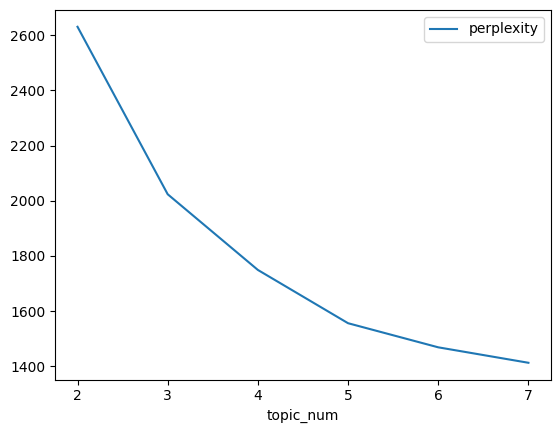

In [ ]:
result.plot.line(x='topic_num', y='perplexity')

<Axes: xlabel='topic_num'>

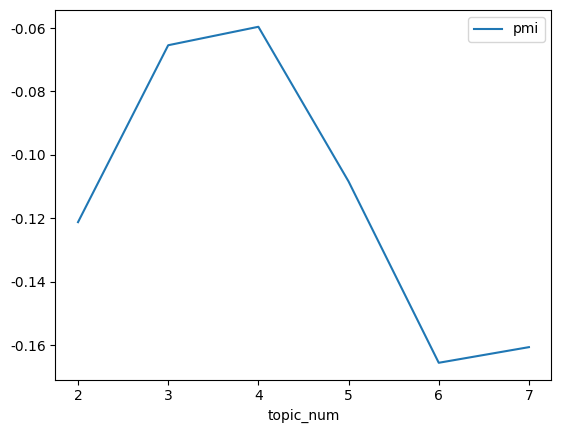

In [ ]:
result.plot.line(x='topic_num', y='pmi')

就訓練結果來看，perplexity 在 4之後不錯，coherence 最高則是 4 ，次高 3 ，決定嘗試跑 4 個主題

## 4. 視覺化呈現

In [ ]:
best_model = LdaModel(
    corpus = corpus,
    num_topics = 4,
    id2word=dictionary,
    random_state = 2025,
    passes = 5 # 訓練次數
    )

In [ ]:
pyLDAvis.enable_notebook()
p = pyLDAvis.gensim_models.prepare(best_model, corpus, dictionary)
p

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.257612  0.023511       1        1  27.853497
3     -0.138553 -0.183321       2        1  27.545877
1      0.323429 -0.123526       3        1  25.828151
0      0.072736  0.283337       4        1  18.772476, topic_info=     Term          Freq         Total Category  logprob  loglift
165    賓士  33649.000000  33649.000000  Default  30.0000  30.0000
221    覺得  20815.000000  20815.000000  Default  29.0000  29.0000
8      台灣  22879.000000  22879.000000  Default  28.0000  28.0000
1569   公里  13871.000000  13871.000000  Default  27.0000  27.0000
38     中華  11062.000000  11062.000000  Default  26.0000  26.0000
...   ...           ...           ...      ...      ...      ...
603    已經   3150.607587   9290.509418   Topic4  -5.4356   0.5914
860    一年   2862.737876   6772.065328   Topic4  -5.5314   0.8118
68     品牌   3291.999985  13793.978517   Topic4  -5.3917   0.2400
254    全球   2777.223326   7839.001815   Topic4  -5.5617   0.6351
13     市場   2817.428888  14105.224720   Topic4  -5.5473   0.0621

[337 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1284      1  0.696866   一台
1284      2  0.301285   一台
1284      3  0.001488   一台
1284      4  0.000406   一台
860       1  0.577224   一年
...     ...       ...  ...
1081      3  0.202809   體驗
1081      4  0.179276   體驗
1008      1  0.024764   高速
1008      2  0.974207   高速
1008      4  0.001136   高速

[637 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 2, 1])

**主題說明:**

**主題 1：充電、里程問題與試乘優缺點**

這個主題主要圍繞充電便利性與續航力問題，以及對電動車的實際體驗，包括對車內空間、後座舒適性與環景系統的感受，反映出消費者主觀評價與情緒面。

**主題 2：電動車性能與功能設計**

此主題聚焦於電動車效能表現，例如引擎動力、油耗問題、以及電動車的科技層面，包括自動駕駛、馬達設計、駕駛模式與螢幕使用等功能性特點。

**主題 3：電動車品牌與國際市場競爭**

這個主題著重於各大品牌在電動車領域的布局，以及中國、美國等國家的市場策略。使用者常提及政府政策，顯示出電動車的國際競爭態勢與地緣政治影響成為討論焦點。

**主題 4：台灣電動車市場與銷售策略**

這個主題探討台灣電動車市場的發展現況，分析車主在購車時所重視的因素，如價格、配件、電池保固與原廠服務，並評估不同車款在台灣的接受度與銷售表現。

### **用主題數6跑跑看**

In [ ]:
model_6 = LdaModel(
    corpus = corpus,
    num_topics = 6,
    id2word=dictionary,
    random_state = 2025,
    passes = 5 # 訓練次數
    )
pyLDAvis.enable_notebook()
p = pyLDAvis.gensim_models.prepare(model_6, corpus, dictionary)
p

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.071400  0.086997       1        1  22.166545
5      0.282182 -0.087440       2        1  19.193565
2     -0.209123  0.234738       3        1  17.253622
4      0.239502  0.137053       4        1  15.464115
1     -0.223611 -0.197190       5        1  14.927839
0     -0.017550 -0.174159       6        1  10.994314, topic_info=     Term          Freq         Total Category  logprob  loglift
165    賓士  36352.000000  36352.000000  Default  30.0000  30.0000
8      台灣  27316.000000  27316.000000  Default  29.0000  29.0000
1569   公里  14399.000000  14399.000000  Default  28.0000  28.0000
38     中華  11583.000000  11583.000000  Default  27.0000  27.0000
19    特斯拉  27481.000000  27481.000000  Default  26.0000  26.0000
...   ...           ...           ...      ...      ...      ...
84     完全   1712.349009   7716.552854   Topic6  -5.5103   0.7023
68     品牌   1701.366323  15237.184302   Topic6  -5.5167   0.0155
248    充電   1683.629581  16922.003398   Topic6  -5.5272  -0.0999
13     市場   1672.757682  15352.823457   Topic6  -5.5337  -0.0090
120    汽車   1620.639059  18680.867981   Topic6  -5.5653  -0.2369

[442 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1284      1  0.135171   一台
1284      2  0.000127   一台
1284      3  0.001909   一台
1284      5  0.734913   一台
1284      6  0.127916   一台
...     ...       ...  ...
2313      3  0.011150   驅動
2313      6  0.000970   驅動
1008      1  0.942803   高速
1008      3  0.018909   高速
1008      6  0.038041   高速

[869 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 6, 3, 5, 2, 1])

**替換主題數跑看看，得到以下主題:**

**主題 1：電動車性能與實用性評價**

此主題聚焦於電動車在日常使用中的實用性與效能表現，例如引擎動力、油耗問題、使用時的困擾與考量。

**主題 2：電動車品牌與國際市場競爭**

這個主題著重於各大品牌在電動車領域的布局，以及中國、美國等國家的市場策略。使用者常提及政府政策，顯示出電動車的國際競爭態勢與地緣政治影響成為討論焦點。

**主題 3：試乘體驗與車內空間舒適性**

此主題圍繞著電動車的實際體驗，特別是試乘後對車內空間、後座舒適性與環景系統的感受，反映出消費者主觀評價。

**主題 4：台灣品牌與車款多樣性**

這個主題關注在台灣銷售的不同品牌業者與不同車款的設計與策略，討論重點在品牌形象與車型、經銷商選擇的多樣性。

**主題 5：保固、充電問題與里程焦慮**

這個主題探討電動車電池保固與原廠服務，以及充電便利性與續航力問題，是電動車使用者最常面對的痛點之一，反映出使用者對於長途駕駛與充電時間安排的實際顧慮。

**主題 6：駕駛輔助與科技功能設計**

此主題探討目前電動車市場中常見的價格活動，分析特斯拉與其他品牌在中國市場的定價策略、人民幣匯率變化的影響，以及車主實際購車後的隱藏成本。

lambda 的意義: <https://nlp.stanford.edu/events/illvi2014/papers/sievert-illvi2014.pdf>

In [ ]:
pyLDAvis.save_html(p, "lda_zh.html")

## 5. GuidedLDA

In [ ]:
!pip install git+https://github.com/Text-Analytics-and-Retrieval/GuidedLDA.git#egg=GuidedLDA

  Cloning https://github.com/Text-Analytics-and-Retrieval/GuidedLDA.git to /tmp/pip-install-f94nhp8d/guidedlda_4fec05d4234f4951a252cf5738f46b81
  Running command git clone --filter=blob:none --quiet https://github.com/Text-Analytics-and-Retrieval/GuidedLDA.git /tmp/pip-install-f94nhp8d/guidedlda_4fec05d4234f4951a252cf5738f46b81
  Resolved https://github.com/Text-Analytics-and-Retrieval/GuidedLDA.git to commit 05c3bf2c18f9d126cc5170256f33e6c1fbc90052
  Preparing metadata (setup.py) ... done


In [ ]:
import guidedlda

In [ ]:
word2id = dictionary.token2id

挑選上面一些有興趣的主題，去給予LDA一些主題種子字：

1. 電動車產業政策與政府角色
2. 電動車功能與設計
3. 電動車充電時間與里程表現

In [ ]:
seed_topic_list = [
    ["中國", "特斯拉", "市場", "台灣", "美國", "政府"],
    ["駕駛", "馬達", "自動", "設計", "功能", "模式"],
    ["充電", "電池", "公里", "時間"],
]

In [ ]:
seed_topics = {}
for t_id, st in enumerate(seed_topic_list):
    for word in st:
        seed_topics[word2id[word]] = t_id

In [ ]:
# guidedlda 需要 DTM 格式作為 input，因此這邊利用 corpus2dense() 方法進行轉換
X = corpus2dense(corpus, len(dictionary), len(corpus)).T.astype(np.int64)

In [ ]:
model = guidedlda.GuidedLDA(n_topics=4, n_iter=100, random_state=2025, refresh=20)
model.fit(X, seed_topics=seed_topics, seed_confidence=1)

In [ ]:
# 整理／顯示主題模型結果
n_top_words = 10
topic_word = model.topic_word_
# 取得corpus全部的詞彙表
vocab = tuple(dictionary.token2id.keys())

for i, topic_dist in enumerate(topic_word):
    # 依照詞語機率從小到大排序，找出每個主題的前十個關鍵詞
    topic_words = np.array(vocab)[np.argsort(topic_dist)][: -(n_top_words + 1) : -1]
    print("C{}: {}".format(i + 1, " ".join(topic_words)))


doc_topic = model.doc_topic_ # 文件-主題 分佈
term_freq = tuple(dictionary.cfs.values()) # 每個詞在整個語料中出現的總次數
doc_len = [sum(v for k, v in doc) for doc in corpus] # 每篇文章的長度

## LDAvis
pyLDAvis.enable_notebook()
p = pyLDAvis.prepare(topic_word, doc_topic, doc_len, vocab = vocab, term_frequency = term_freq)
p

C1: 賓士 台灣 特斯拉 電動車 中國 中華 市場 美國 政策 戴姆勒
C2: 駕駛 空間 比較 覺得 來說 問題 電動車 後座 試駕 設計
C3: 電車 油車 充電 電池 電動車 公里 台灣 使用 現在 覺得
C4: 小米 汽車 電動車 品牌 模型 產品 車款 搭配 現在 銷量


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.151565  0.135529       1        1  27.213897
3      0.159942 -0.231692       2        1  25.204763
0      0.225253  0.174479       3        1  24.037106
1     -0.233631 -0.078315       4        1  23.544233, topic_info=     Term          Freq         Total Category  logprob  loglift
165    賓士  28787.000000  28787.000000  Default  30.0000  30.0000
191    電車  26529.000000  26529.000000  Default  29.0000  29.0000
598    小米  14554.000000  14554.000000  Default  28.0000  28.0000
1272   油車  17521.000000  17521.000000  Default  27.0000  27.0000
8      台灣  29498.000000  29498.000000  Default  26.0000  26.0000
...   ...           ...           ...      ...      ...      ...
209    應該   3980.471425   9527.992129   Topic4  -5.4283   0.5735
1081   體驗   3274.566937   5792.331011   Topic4  -5.6235   0.8759
29    電動車   5786.227098  39128.020000   Topic4  -5.0542  -0.4651
248    充電   4158.447344  23120.775094   Topic4  -5.3845  -0.2693
1448   里程   3105.589800   6195.368162   Topic4  -5.6765   0.7557

[279 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
198       1  0.245789    一下
198       2  0.110605    一下
198       4  0.643714    一下
1284      1  0.655831    一台
1284      2  0.242907    一台
...     ...       ...   ...
196       2  1.000061    驚人
1081      2  0.140703    體驗
1081      3  0.294009    體驗
1081      4  0.565403    體驗
7489      4  1.000101  高速行駛

[457 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 1, 2])

從關鍵字去分析主題的內容:

主題1：
關鍵字有「電車」、「油車」、「公里」、「充電」、「使用」等詞，這個主題可能是在比較電動車與油車在實際使用上的差異，特別聚焦在續航距離、充電便利性與轉換意願上。

主題2：
關鍵字有「小米」、「品牌」、「模型」、「車款」、「產品」等與商品定位有關的詞彙，也出現了「銷量」、「搭配」這類與行銷或市場策略有關的字詞，推測這個主題可能在談論小米進軍電動車市場的策略佈局與產品發展。

主題3：
關鍵字有「特斯拉」、「中國」、「台灣」、「市場」這些種子字，這類文章應多為探討國際間電動車產業的政策變化、市場策略與品牌競爭。

主題4：
關鍵字有「駕駛」、「空間」、「後座」、「設計」等實體名詞，也出現了「覺得」、「比較」、「問題」這類主觀評價詞，推測這個主題主要來自車主或試駕者對電動車內裝設計與乘坐體驗的評價與討論。

從結果來看，seedword有成功引導LDA模型去產出我們感興趣的主題類型

In [ ]:
model_6 = guidedlda.GuidedLDA(n_topics=6, n_iter=100, random_state=2025, refresh=20)
model_6.fit(X, seed_topics=seed_topics, seed_confidence=1)

In [ ]:
# 整理／顯示主題模型結果
n_top_words = 10
topic_word = model_6.topic_word_
# 取得corpus全部的詞彙表
vocab = tuple(dictionary.token2id.keys())

for i, topic_dist in enumerate(topic_word):
    # 依照詞語機率從小到大排序，找出每個主題的前十個關鍵詞
    topic_words = np.array(vocab)[np.argsort(topic_dist)][: -(n_top_words + 1) : -1]
    print("C{}: {}".format(i + 1, " ".join(topic_words)))


doc_topic = model_6.doc_topic_ # 文件-主題 分佈
term_freq = tuple(dictionary.cfs.values()) # 每個詞在整個語料中出現的總次數
doc_len = [sum(v for k, v in doc) for doc in corpus] # 每篇文章的長度

## LDAvis
pyLDAvis.enable_notebook()
p = pyLDAvis.prepare(topic_word, doc_topic, doc_len, vocab = vocab, term_frequency = term_freq)
p

C1: 賓士 台灣 特斯拉 電動車 中國 中華 美國 市場 戴姆勒 克萊斯勒
C2: 駕駛 空間 比較 來說 後座 問題 設計 試駕 使用 休息
C3: 充電 電動車 電池 電車 覺得 台灣 油車 公里 時間 使用
C4: 小米 電車 油車 現在 二手 知道 車行 車款 分享 公里
C5: 電動車 覺得 現在 設計 應該 真的 比較 空間 試乘 看看
C6: 品牌 汽車 電動車 車款 搭配 產品 銷量 性能 模型 全新


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.277790 -0.114842       1        1  19.457760
2      0.075533  0.007552       2        1  19.031804
5     -0.174775 -0.027036       3        1  17.811267
1      0.226304 -0.143817       4        1  16.229064
3      0.007644  0.328182       5        1  14.966630
4      0.143084 -0.050040       6        1  12.503475, topic_info=     Term          Freq         Total Category  logprob  loglift
165    賓士  28786.000000  28786.000000  Default  30.0000  30.0000
598    小米  14555.000000  14555.000000  Default  29.0000  29.0000
1272   油車  17521.000000  17521.000000  Default  28.0000  28.0000
8      台灣  29497.000000  29497.000000  Default  27.0000  27.0000
191    電車  26529.000000  26529.000000  Default  26.0000  26.0000
...   ...           ...           ...      ...      ...      ...
191    電車   1585.592573  26529.173872   Topic6  -5.7158  -0.7381
686    知道   1379.646791  10435.745073   Topic6  -5.8550   0.0558
654    業務   1252.680216   5215.436308   Topic6  -5.9515   0.6528
1081   體驗   1257.678900   5791.992562   Topic6  -5.9475   0.5520
19    特斯拉   1300.667583  19846.981129   Topic6  -5.9139  -0.6460

[428 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
198       2  0.256825    一下
198       4  0.310860    一下
198       5  0.101289    一下
198       6  0.331202    一下
1284      2  0.366921    一台
...     ...       ...   ...
1081      6  0.217196    體驗
3208      3  1.000091    高層
3311      4  1.000093    高架
7489      4  1.000120  高速行駛
2163      2  1.000108    高鐵

[800 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 3, 6, 2, 4, 5])

結果設定主題數為6的表現從視覺化來看不太好，主題2和主題6有一些重疊。

從關鍵字來看，主題2是充電和實際使用心得相關；主題6是功能設計和實際體驗相關。 兩者的高頻關鍵詞都有「充電」、「覺得」

## 6.主題分佈的比例


### 6.0. 列出文章數量

In [ ]:
# 取得每條新聞的主題分佈
topics_doc = best_model.get_document_topics(corpus)

In [ ]:
topics_doc[100]

[(0, 0.99766004)]

#### 將 LDA 模型推論後的每篇文件的 主題分布（也就是 𝜃）轉換成一個 NumPy 矩陣（array）

In [ ]:
# 把 gensim 的稀疏表示法轉成稀疏矩陣
m_theta = corpus2csc(topics_doc).T.toarray() # 倒置讓shape變為(num_docs, num_topics)
m_theta

array([[0.74987042, 0.09461252, 0.        , 0.14875162],
       [0.74987715, 0.0946048 , 0.        , 0.14875236],
       [0.74987513, 0.09460709, 0.        , 0.14875212],
       ...,
       [0.03647014, 0.67847335, 0.01745471, 0.26760179],
       [0.26409069, 0.19685559, 0.0483919 , 0.4906618 ],
       [0.2640897 , 0.1968562 , 0.04839516, 0.49065891]])

In [ ]:
# 將主題的機率分布轉換成主題標籤
udn['topic_label'] = m_theta.argmax(axis=1) + 1

#### 統計一下各個主題的數量

In [ ]:
udn['topic_label'].value_counts()

,count
topic_label,
4,5487
1,4187
3,3930
2,3593


In [ ]:
udn['artDate'] = pd.to_datetime(noStop_df['artDate'])

In [ ]:
udn.head()

,content,words,topic_label,artDate
0,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,...",1,2025-01-02 08:50:33
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,...",1,2025-01-02 08:50:33
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,...",1,2025-01-02 08:50:33
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,...",1,2025-01-02 08:50:33
1,如題台灣擁有全世界最貴的電動車價格以年為例世界各國都萬以內的時候台灣硬是要賣超過萬年底中國電...,"[如題, 台灣, 擁有, 全世界, 最貴, 電動車, 價格, 以年, 為例, 世界, 各國,...",1,2025-01-02 08:50:33


### 查看年月主題分布

In [ ]:
date_topic = udn.groupby(udn['artDate'].dt.date)['topic_label'].value_counts(normalize=True).unstack()
date_topic

topic_label,1,2,3,4
artDate,,,,
2025-01-02,0.745763,0.254237,NaN,NaN
2025-01-03,0.899756,0.002445,0.0978,NaN
2025-01-05,NaN,1.000000,NaN,NaN
2025-01-06,0.996084,NaN,NaN,0.003916
2025-01-07,NaN,NaN,NaN,1.000000
...,...,...,...,...
2025-06-06,NaN,0.857143,NaN,0.142857
2025-06-09,NaN,NaN,NaN,1.000000
2025-06-10,NaN,NaN,NaN,1.000000


In [ ]:
date_topic.reset_index(inplace=True)

In [ ]:
date_topic

topic_label,artDate,1,2,3,4
0,2025-01-02,0.745763,0.254237,NaN,NaN
1,2025-01-03,0.899756,0.002445,0.0978,NaN
2,2025-01-05,NaN,1.000000,NaN,NaN
3,2025-01-06,0.996084,NaN,NaN,0.003916
4,2025-01-07,NaN,NaN,NaN,1.000000
...,...,...,...,...,...
103,2025-06-06,NaN,0.857143,NaN,0.142857
104,2025-06-09,NaN,NaN,NaN,1.000000
105,2025-06-10,NaN,NaN,NaN,1.000000
106,2025-06-12,NaN,NaN,1.0000,NaN


In [ ]:
date_topic['artDate'] = pd.to_datetime(date_topic['artDate'])

date_topic['year_month'] = date_topic['artDate'].dt.to_period('M')

date_topic = date_topic.drop(columns=['artDate'])
# 以年月做分組
month_topic = date_topic.groupby('year_month').mean()

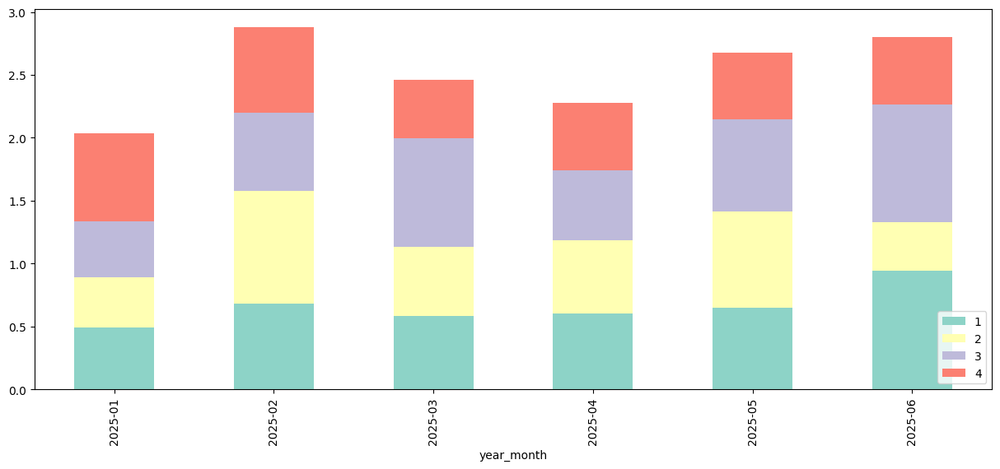

In [ ]:
fig, ax = plt.subplots(figsize=(15, 6))
month_topic.plot.bar(ax=ax, stacked=True, color = plt.cm.Set3.colors)
ax.legend(loc='lower right')

從主題分布來看，2月的時候主題2占比大幅提升，推測可能是因小米發表新車款預告、釋出設計與功能細節，因此引發媒體與社群大量討論。

而在三月、六月時，主題3占比大幅提升，可能與特斯拉當月在中國與台灣的市場動態有關，包括價格政策調整、政府補貼消息、品牌間競爭升溫或國際財報釋出等。

另外在六月時，主題1占比也很高，可能是因暑假前夕，很多家庭和個人會計劃長途自駕旅行，這時對於「電動車續航距離」和「充電便利性」的討論便會增加。

可見和電動車相關的文章討論多是關於各品牌功能、市場動態以及充電便利性、續航力等實際需求，電動車市場快速發展，技術日新月異，這些相關討論反映出消費者在選擇電動車時最關心的幾個問題。


# 四、LLM 情緒建模
針對上面，我們已經透過 LDA, GuidedLDA進行主題建模，看到了目前的內容分法。
- 我們使用 LLM 嘗試分類，查看內容。

## 4.0. 連接雲端資料夾

In [ ]:
import os

from google.colab import drive
drive.mount('/content/drive')

os.chdir('/content/drive/MyDrive/week13') #切換該目錄
os.listdir() #確認目錄內容

Mounted at /content/drive


['LLM_Inference_application.ipynb', 'data', 'dict']

## 套件安裝

In [ ]:
!pip install langchain_community langchain_chroma grandalf langchain_huggingface pypdf sentence-transformers
!pip install langchain_chroma
!pip install grandalf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 5.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.2/304.2 kB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 110.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.1/438.1 kB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.0/363.0 kB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.8 MB/s eta

In [ ]:
!pip install -U langchain-ollama
!pip install -U langchain-huggingface
!pip install --upgrade transformers

In [ ]:
import os
from getpass import getpass

import pandas as pd
import ast
import json
import re
import jieba

import torch

from langchain_community.llms import HuggingFaceEndpoint

from langchain_ollama.llms import OllamaLLM

from langchain_core.prompts import PromptTemplate
from langchain_core.prompts import ChatPromptTemplate

from langchain_core.runnables import RunnablePassthrough
from langchain_core.runnables import RunnableParallel
from langchain_core.runnables import RunnableLambda

from langchain_core.output_parsers import JsonOutputParser
from langchain_core.pydantic_v1 import BaseModel, Field

from langchain_community.document_loaders import PyPDFLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_chroma import Chroma
from langchain_community.embeddings.sentence_transformer import (
    SentenceTransformerEmbeddings,
)

/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py:3553: LangChainDeprecationWarning: As of langchain-core 0.3.0, LangChain uses pydantic v2 internally. The langchain_core.pydantic_v1 module was a compatibility shim for pydantic v1, and should no longer be used. Please update the code to import from Pydantic directly.

For example, replace imports like: `from langchain_core.pydantic_v1 import BaseModel`
with: `from pydantic import BaseModel`
or the v1 compatibility namespace if you are working in a code base that has not been fully upgraded to pydantic 2 yet. 	from pydantic.v1 import BaseModel

  exec(code_obj, self.user_global_ns, self.user_ns)


## 4.1. LLM inference

### Ollama

In [ ]:
# Step 1: Install Linux packages.
!apt-get install pciutils lshw

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpci3 pci.ids usb.ids
The following NEW packages will be installed:
  libpci3 lshw pci.ids pciutils usb.ids
0 upgraded, 5 newly installed, 0 to remove and 35 not upgraded.
Need to get 883 kB of archives.
After this operation, 3,256 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 pci.ids all 0.0~2022.01.22-1ubuntu0.1 [251 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libpci3 amd64 1:3.7.0-6 [28.9 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 lshw amd64 02.19.git.2021.06.19.996aaad9c7-2build1 [321 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/main amd64 pciutils amd64 1:3.7.0-6 [63.6 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy/main amd64 usb.ids all 2022.04.02-1 [219 kB]
Fetched 883 kB in 1s (597 kB/s)
Selecting previously unselected package pc

In [ ]:
# Step 2: Install the Colab extension: colab-xterm
## Project Github Repo: https://github.com/InfuseAI/colab-xterm

!pip install -q colab-xterm
%load_ext colabxterm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.6/115.6 kB 3.4 MB/s eta 0:00:00


In [ ]:
# Step 3: Install ollama
## Project Github Repo: https://github.com/ollama/ollama

!curl https://ollama.ai/install.sh | sh

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 13281    0 13281    0     0  55676      0 --:--:-- --:--:-- --:--:-- 55802
>>> Installing ollama to /usr/local
>>> Downloading Linux amd64 bundle
######################################################################## 100.0%
>>> Creating ollama user...
>>> Adding ollama user to video group...
>>> Adding current user to ollama group...
>>> Creating ollama systemd service...
>>> NVIDIA GPU installed.
>>> The Ollama API is now available at 127.0.0.1:11434.
>>> Install complete. Run "ollama" from the command line.


In [ ]:
# Step 6: Launching Xterm.
## Notice: When xterm is successfully started, you need to run the ollama server and keep it running
## 若前一格安裝在此格出現的終端機中輸入指令: ollama serve
%xterm height=300

Launching Xterm...

<IPython.core.display.Javascript object>

In [ ]:
!ollama pull gemma3:4b-it-qat

In [ ]:
df = pd.read_csv("./data/ptt_car_2025.csv")
df["artDate"] = pd.to_datetime(df["artDate"])
df['artDate'] = df['artDate'].dt.date

clear_df = df.copy()

#去除本次不會用到的欄位
drop_cols = ['system_id', 'artPoster', 'artCatagory', 'artComment', 'e_ip', 'insertedDate', 'dataSource']
clear_df.drop(drop_cols, axis = 1, inplace = True)

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['artContent'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['artContent'] = clear_df['artContent'].str.replace(r'\n','', regex=True)

#移除內文中的網址
clear_df['artContent'] = clear_df['artContent'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

#抓取200筆
clear_df = clear_df.sample(n=200, random_state=222)

clear_df.head()

,artUrl,artTitle,artDate,artContent
130,https://www.ptt.cc/bbs/car/M.1738938061.A.16E....,"[新聞]ToyotaRAV4成為美國新神車,擊敗長年冠軍福特F-150",2025-02-07,"RAV4以475,193輛的銷量，成功超越Ford福特F-150的460,915輛，成為美..."
268,https://www.ptt.cc/bbs/car/M.1745633192.A.B25....,Re:[新聞]黨說話了：電動車電池不准內部起火、爆,2025-04-26,該文章最下方有個連結我覺得要一起看才行..。電動汽車用動力蓄電池安全要求 vehicles ...
172,https://www.ptt.cc/bbs/car/M.1741258723.A.7FE....,[閒聊]馬克斯道出產品製造真諦：做減法,2025-03-06,美國純電動汽車（EV）企業特斯拉以及太空開發初創企業太空探索技術公司(SpaceX)的創始人...
103,https://www.ptt.cc/bbs/car/M.1737883061.A.E8C....,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞起,2025-01-26,看了一下Reddit國外ioniq5車主車禍的情況看車主說明當下車門有被解鎖，門也打得開也有...
298,https://www.ptt.cc/bbs/car/M.1747586087.A.C12....,[新聞]中國汽車強力挑戰，日系品牌在東協汽車虐,2025-05-19,2023 年的年度累計新車銷售量超過 335 萬輛 (2022 年超過 342 萬輛)，其...


設定只能將文章主題分成以下四種:
1. 車款性能討論
2. 試駕與乘坐體驗
3. 充電與續航距離
4. 電動車市場的佈局與競爭

In [ ]:
def build_prompt(text):
    return f"""你是一位電動車評論分析師，你將會閱讀網路上關於汽車或電動車的文章，請根據文章內容抓取出：

1. 此文章的情緒：正面、負面、中性或無法判斷(空值或無法判斷都歸於此)
2. 文章講述的主題，分為以下四種類別：
- 車款性能討論
- 試駕與乘坐體驗
- 充電與續航距離
- 電動車市場的佈局與競爭
若不屬於這四種類別，便歸類為無法判斷

以下為一些範例：
```
範例1
句子：這次小米新推出的車款在性能表現上真的讓我驚艷，性價比超高。
抓取結果：{{
    "情緒": "正面",
    "主題種類": "車款性能討論"
}}

範例2
句子：我週末去試駕了Model Y，整體駕駛感受很順，座椅也比我想像中舒服。
抓取結果：{{
    "情緒": "正面",
    "主題種類": "試駕與乘坐體驗"
}}

範例3
句子：我住的地方充電站太少了，跑長途真的會焦慮，續航根本不夠用。
抓取結果：{{
    "情緒": "負面",
    "主題種類": "充電與續航距離"
}}

範例4
句子：比亞迪在這次618的促銷真的超猛，感覺快要把其他品牌打趴了。
抓取結果：{{
    "情緒": "正面",
    "主題種類": "電動車市場的佈局與競爭"
}}

範例5
句子：試乘後覺得整體加速很猛，但轉彎時穩定性不如預期，有點失望。
抓取結果：{{
    "情緒": "負面",
    "主題種類": "試駕與乘坐體驗"
}}

請使用以下 JSON 格式回覆：
{{
  "情緒": "",
  "主題種類": ""
}}

文章內容如下：
{text}
"""


In [ ]:
import subprocess

def run_ollama_model(prompt):
    try:
        result = subprocess.run(
            ['ollama', 'run', 'gemma3:4b-it-qat'],
            input=prompt.encode('utf-8'),
            stdout=subprocess.PIPE,
            stderr=subprocess.PIPE,
            timeout=60
        )
        return result.stdout.decode('utf-8')
    except subprocess.TimeoutExpired:
        return "[TIMEOUT]"
    except Exception as e:
        return f"[ERROR] {e}"


In [ ]:
import pandas as pd

results = []

for i, row in clear_df.iterrows():
    prompt = build_prompt(row["artContent"])
    print(f"正在處理第{i}篇文章")
    output = run_ollama_model(prompt)
    print(f"回傳結果：{output[:100]}...")  # 只印前100字
    results.append(output)

clear_df["分類結果_raw"] = results


正在處理第130篇文章
回傳結果：```json
{
 "情緒": "中性",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第268篇文章
回傳結果：```json
{
 "情緒": "中性",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第172篇文章
回傳結果：```json
{
 "情緒": "中性",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第103篇文章
回傳結果：```json
{
 "情緒": "中性",
 "主題種類": "無法判斷"
}
```

**理由：**

這篇文章主要描述了一起IONIQ 5車禍事件的推測，並沒有直接表達任何正面或負面的情緒。文...
正在處理第298篇文章
回傳結果：```json
{
 "情緒": "負面",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第246篇文章
回傳結果：```json
{
 "情緒": "正面",
 "主題種類": "車款性能討論"
}
```

...
正在處理第281篇文章
回傳結果：```json
{
 "情緒": "正面",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第79篇文章
回傳結果：```json
{
 "情緒": "負面",
 "主題種類": "無法判斷"
}
```


...
正在處理第19篇文章
回傳結果：請您提供文章內容，我會按照您的指示進行分析並以 JSON 格式回覆。請將文章內容貼上來。


...
正在處理第166篇文章
回傳結果：```json
{
 "情緒": "中性",
 "主題種類": "電動車市場的佈局與競爭"
}
```


...
正在處理第68篇文章
回傳結果：```json
{
 "情緒": "正面",
 "主題種類": "充電與續航距離"
}
```

...
正在處理第261篇文章
回傳結果：```json
{
 "情緒": "正面",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第136篇文章
回傳結果：```json
{
 "情緒": "正面",
 "主題種類": "電動車市場的佈局與競爭"
}
```

...
正在處理第190篇文章
回傳

In [ ]:
import json

def extract_json(text):
    try:
        start = text.find('{')
        end = text.rfind('}') + 1
        json_text = text[start:end]
        parsed = json.loads(json_text)
        return parsed.get("情緒", ""), parsed.get("主題種類", "")
    except:
        return "", ""

clear_df[["情緒", "主題種類"]] = clear_df["分類結果_raw"].apply(extract_json).apply(pd.Series)


In [ ]:
clear_df.head()

,artUrl,artTitle,artDate,artContent,分類結果_raw,情緒,主題種類
130,https://www.ptt.cc/bbs/car/M.1738938061.A.16E....,"[新聞]ToyotaRAV4成為美國新神車,擊敗長年冠軍福特F-150",2025-02-07,"RAV4以475,193輛的銷量，成功超越Ford福特F-150的460,915輛，成為美...","```json\n{\n ""情緒"": ""中性"",\n ""主題種類"": ""電動車市場的佈局與競...",中性,電動車市場的佈局與競爭
268,https://www.ptt.cc/bbs/car/M.1745633192.A.B25....,Re:[新聞]黨說話了：電動車電池不准內部起火、爆,2025-04-26,該文章最下方有個連結我覺得要一起看才行..。電動汽車用動力蓄電池安全要求 vehicles ...,"```json\n{\n ""情緒"": ""中性"",\n ""主題種類"": ""電動車市場的佈局與競...",中性,電動車市場的佈局與競爭
172,https://www.ptt.cc/bbs/car/M.1741258723.A.7FE....,[閒聊]馬克斯道出產品製造真諦：做減法,2025-03-06,美國純電動汽車（EV）企業特斯拉以及太空開發初創企業太空探索技術公司(SpaceX)的創始人...,"```json\n{\n ""情緒"": ""中性"",\n ""主題種類"": ""電動車市場的佈局與競...",中性,電動車市場的佈局與競爭
103,https://www.ptt.cc/bbs/car/M.1737883061.A.E8C....,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞起,2025-01-26,看了一下Reddit國外ioniq5車主車禍的情況看車主說明當下車門有被解鎖，門也打得開也有...,"```json\n{\n ""情緒"": ""中性"",\n ""主題種類"": ""無法判斷""\n}\n...",中性,無法判斷
298,https://www.ptt.cc/bbs/car/M.1747586087.A.C12....,[新聞]中國汽車強力挑戰，日系品牌在東協汽車虐,2025-05-19,2023 年的年度累計新車銷售量超過 335 萬輛 (2022 年超過 342 萬輛)，其...,"```json\n{\n ""情緒"": ""負面"",\n ""主題種類"": ""電動車市場的佈局與競...",負面,電動車市場的佈局與競爭


In [ ]:
clear_df.to_csv("c_result2.csv", index=False)

In [ ]:
clear_df['主題種類'].value_counts()

,count
主題種類,
電動車市場的佈局與競爭,116
無法判斷,45
車款性能討論,20
充電與續航距離,15
試駕與乘坐體驗,2


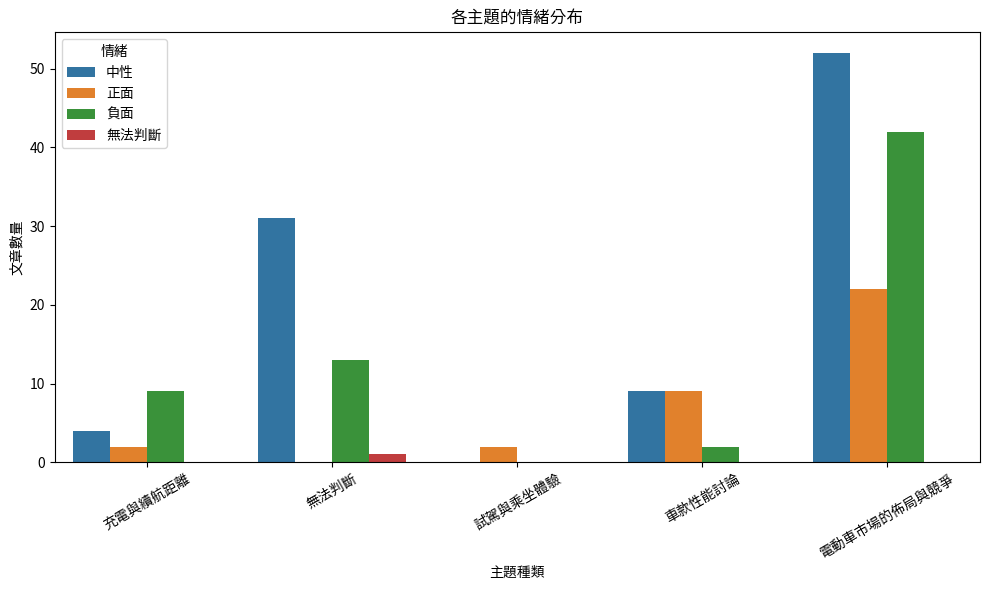

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fontManager
import seaborn as sns
import pandas as pd

# 加入字體
fontManager.fontManager.addfont('TaipeiSansTCBeta-Regular.ttf')
# 取得字體名稱
taipei_font = fontManager.FontProperties(fname='TaipeiSansTCBeta-Regular.ttf').get_name()
# 設定全域字體
plt.rcParams['font.family'] = taipei_font

# 確保欄位沒有空值
df_plot = clear_df.dropna(subset=["情緒", "主題種類"])
count_df = df_plot.groupby(["主題種類", "情緒"]).size().reset_index(name='數量')

# 畫圖
plt.figure(figsize=(10, 6))
sns.barplot(data=count_df, x="主題種類", y="數量", hue="情緒")

plt.title("各主題的情緒分布")
plt.xticks(rotation=30)
plt.xlabel("主題種類")
plt.ylabel("文章數量")
plt.legend(title="情緒")
plt.tight_layout()
plt.show()


根據分布結果，我們想了解:

1.在充電與續航距離的主題中，負向情緒的文章多在討論什麼?

2.在電動車市場的佈局與競爭的主題中，負向以及正向情緒的文章分別在討論什麼?

In [ ]:
topic1_df = clear_df[
    (clear_df["情緒"] == "負面") &
    (clear_df["主題種類"] == "充電與續航距離")
]

In [ ]:
topic1_df[["artTitle", "artContent"]].head(10)

,artTitle,artContent
99,[新聞]自撞4死小舅子曝姊夫習慣輔助駕駛,原文： 13:15:00記者陸運陞、陳韻如／桃園報導。40歲倪姓男子帶著妻小一家五口，以及展...
128,[情報]英國超狂電動車政策少賣一部罰62萬,"1 Series在當地的基礎牌價為31,065英鎊，就知道相關的罰則不輕。。為了降低損失，..."
85,[問題]油電車也會難滅火易起火？,電動車難滅火易起火。那油電車是否也這樣。本魯開一台lexus油電車。開始擔心起來
28,Re:[問題]電動車仍然是未來的趨勢嗎？,所造成的汙染 不在乎像是大量廢棄電池 重金屬汙染 有想過怎麼解嗎。其實油電車我覺得...
95,[閒聊]電動車緩燒的特性對救援的幫助,撞車起火，已經燒到的部分（前座）就回天乏術了 但還沒燒到的部分（後座），若有善心人士伸出援...
105,[新聞]楊梅火燒車同車型韓國也曾自撞電池起火3,楊梅火燒車同車型韓國也曾自撞 電池起火3秒內飆升至800度難逃 游舒婷 報導。國道1號南下楊...
217,Re:[新聞]又是車門鎖死小米su7電動車起火燒死3,3?活徽?車?，的車車?號?咋?關追?身?不熟電子式開門的人 千萬不要借電動車來開。一般來說...
23,[問題]電動車仍然是未來的趨勢嗎？,電車目前銷量感覺就是平穩平穩簡單說會買電車的族群就是那一塊。大家詬病的不外乎就是1.充電樁：...
110,Re:[閒聊]電車是不是儘量買磷酸鐵鋰電池比較安全？,時生燒和這不是電池用什麼就安全。而是電動車電壓動輒500伏特一個碰撞短路就產生超高溫火花整個...


可以看見這些文章都與電池、充電、電壓、續航、安全有關。

但在情緒面向，討論的不是功能提升，而是災難、焦慮、恐懼、疑問、擔心，甚至死亡。

因此，雖然主題分類落在「充電與續航距離」，但因為語意上多與風險、事故、災害、安全疑慮有關，因此 LLM 判定為負面情緒是合理的。

In [ ]:
topic4_df = clear_df[
    (clear_df["情緒"] == "負面") &
    (clear_df["主題種類"] == "電動車市場的佈局與競爭")
]

In [ ]:
topic4_df[["artTitle", "artContent"]].head(10)

,artTitle,artContent
298,[新聞]中國汽車強力挑戰，日系品牌在東協汽車虐,2023 年的年度累計新車銷售量超過 335 萬輛 (2022 年超過 342 萬輛)，其...
223,Re:[新聞]又是車門鎖死小米su7電動車起火燒死3,重點，先自撞後起火，不是先起火後自撞，不自撞就不會起火，很難懂嗎？。車是買來開的，不是買來撞...
71,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞起火,這個地方叫做L2自動駕駛的墳場只要從五楊高架下來 就會默默被導到休息站入口測試過除了特斯拉可...
218,Re:[新聞]又是車門鎖死小米su7電動車起火燒死3,我前面不是說了。中國車=電子垃圾。。特斯拉從加州懸崖75米掉落 車上四人全部輕傷。特斯拉高速...
143,[新聞]中國車在東南亞份額增加，日本車陷苦戰,中國車在東南亞份額增加，日本車陷苦戰。日經中文網。2025/02/11 東南亞的新車市場規...
309,Re:[新聞]獨／特斯拉單親爸挨酸活該不保險 電動車,保險不就是保險公司抓大數據(如肇事率)。然後用平均修車費用 加權肇事率後。再加上自己想要的利...
167,[新聞]2025年式ToyotabZ4X心動價136萬元！,"新聞連結： bZ4X 25年式全新到港，心動價136萬元，線上預選再享首年超低月付$9,00..."
147,[閒聊]日本路上電動車怎麼這麼少見？,來日本九州開車開一個禮拜。路上沒幾台電動車。高速公路休息站也只有一個快充站。日本人不是很講究...
306,[新聞]因應關稅談判！傳經濟部擬優先降電動車,[新聞](需檢附來源) 原本以為是特斯拉條款。 但是卡到電池這一個設定。 這樣到...
108,[新聞]楊梅火燒車4死事故車款曝光 「鎖外不鎖,[新聞](需檢附來源)楊梅火燒車4死事故車款曝光 「鎖外不鎖內」設計隱藏門把 5 EV600...


這些文章屬「電動車市場的佈局與競爭」主題，但情緒上涉及了市場失利、品牌形象受損、設計缺陷、車禍起火、人命損傷、政策不確定性、國家競爭壓力等，因此 LLM 判定為負面情緒是合理的。

In [ ]:
po_topic4_df = clear_df[
    (clear_df["情緒"] == "正面") &
    (clear_df["主題種類"] == "電動車市場的佈局與競爭")
]

In [ ]:
po_topic4_df[["artTitle", "artContent"]].head(10)

,artTitle,artContent
281,[新聞]海外表現強勁！陸車廠主導全球新能源汽,1.媒體來源:鉅亨網。2.記者署名:陳韋廷。3.完整新聞標題:海外表現強勁！陸車廠主導全球新...
261,[新聞]Luxgen宣佈「OneofTaiwan」系列活動,[新聞](需檢附來源)Luxgen宣佈「On e of Taiwan」系列活動，《電池Car...
136,[新聞]DeepSeek紅火！陸車企爭相引進吉利宣布,DeepSeek紅火！陸車企爭相引進 吉利宣布完成深度融合。2025/02/09 02:11...
190,[新聞]川普親自為特斯拉代言在白宮舉辦獨家車展,川普親自為特斯拉代言？在白宮舉辦獨家車展 2025-03-12 10:00。美國總統川普周...
171,"[新聞]20,000歐元起！Volkswagen入門級電動車型","原文標題：20,000歐元起！Volkswagen入門級電動車型ID. EVERY1亮相。日..."
3,[新聞]台灣大哥大MyCharge進駐13家好市多,台灣大哥大MyCharge進駐13家好市多 全台充電樁逾400座024.12.30 16:...
180,[新聞]比亞迪與大疆聯手推出車載無人機系統,比亞迪與大疆聯手推出車載無人機系統 靈鳶可以動態起降 平方公尺的面積，外觀設計具備優異的空氣...
324,[新聞]劍指NissanSakura！比亞迪擬在日本推輕,1.媒體來源:聯合報。2.記者署名:記者 黃雅慧／即時報導。3.完整新聞標題:劍指Nissa...
1,[新聞]2024台灣最暢銷10款新車「TOYOTA神車再破,2024台灣最暢銷10款新車「TOYOTA神車再破3萬輛」！特斯拉成最賣電車。記者張慶輝／綜...
189,[情報]全新23年式Solterra降價52.3萬,台灣電動車市場競爭加劇，日前Toyota總代理。和泰汽車針對2025年式bZ4X祭出降價措施...


主題皆屬市場佈局與競爭，如品牌推展、合作策略、價格政策，文章語氣是向好、樂觀、進展中。也有許多正面關鍵詞出現，如「強勁」「主導」「升級」「新技術」「進駐」「熱賣」「合作」「降價」等。

# 五、中文社群網路分析

本段落為社會網路分析，透過將發文者和評論者之間的關係進行分組，建立一個社群的有向圖。

接著以networkx的方法示範各種中心分數的計算，並以分數作為節點大小進行網路圖的繪製，觀察不同Centrality的區別。

在最後的部分則會使用networkx的方法計算網路圖的各種常見指標係數。

### 5.0. 大綱

1. 資料前處理
    *   文章、發文者與留言者關係
    *   網友之間關係（發文者與留言者）
2. Measures on node
  *   Eigenvector Centrality
  *   Page Rank
  *   Hit scroe
  *   Betweenness Centrailty

3. Measures on graph

### 套件說明

1. pyvis、networkx：畫關係網路圖
2. pandas：資料處理
3. numpy：用來處理矩陣

In [ ]:
! pip install pandas
! pip install numpy
! pip install pyvis
! pip install networkx
! pip install IPython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 71.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import pyvis
import networkx as nx
import IPython

### 連結雲端資料夾

In [ ]:
import os

from google.colab import drive
drive.mount('/content/drive')

os.chdir('/content/drive/MyDrive/colab/final_project') #切換該目錄
os.listdir() #確認目錄內容

Mounted at /content/drive


['ppt_car.csv', 'ppt_car_2025.csv', 'pers_netWork.html', 'basic_netWork.html']

### 讀取資料
使用與PTT上與電動車相關文章來查看發文者與留言者的關係

In [ ]:
raw_data = pd.read_csv('./ppt_car_2025.csv')
print(raw_data.shape)
raw_data.head()

(340, 11)


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,3640,https://www.ptt.cc/bbs/car/M.1735779035.A.1DC....,[問題]2025年了台灣電動車還是全球最貴嗎？,2025-01-02 08:50:33,csgod1325,car,如題\n台灣擁有全世界最貴的電動車價格\n以2023 年Model Y 為例，世界各國都20...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""sbax8186"", ""...",111.246.199.70,2025-01-03 01:01:40,ptt
1,3641,https://www.ptt.cc/bbs/car/M.1735793069.A.B8F....,[新聞]2024台灣最暢銷10款新車「TOYOTA神車再破,2025-01-02 12:44:27,mingtingC,car,2024台灣最暢銷10款新車「TOYOTA神車再破3萬輛」！特斯拉成最賣電車\n\n記者張慶...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""maniaque"", ""...",223.136.115.35,2025-01-03 01:01:43,ptt
2,3642,https://www.ptt.cc/bbs/car/M.1735896595.A.EF5....,Re:[心得]電動車大電池原廠保固的真相(12/6更新),2025-01-03 17:29:53,Dogmahan,car,趁著昨天回VW的時候問了一下接待\n\n簡單來說，因為MEB平台是模組化的電池設計\n如果遇...,"[{""cmtStatus"": ""噓"", ""cmtPoster"": ""AMSTERDAM14""...",49.216.25.244,2025-01-04 01:01:48,ptt
3,3643,https://www.ptt.cc/bbs/car/M.1735896713.A.A07....,[新聞]台灣大哥大MyCharge進駐13家好市多,2025-01-03 17:31:51,tvdefeld,car,台灣大哥大MyCharge進駐13家好市多 全台充電樁逾400座\n024.12.30 1...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""n74042300"", ...",114.136.249.95,2025-01-04 01:01:48,ptt
4,3644,https://www.ptt.cc/bbs/car/M.1735902293.A.5EB....,[新聞]特斯拉2024年交車衰退，台系供應鏈有感,2025-01-03 19:04:51,maniaque,car,[來源]\nhttps://reurl.cc/6jbaMZ\n[新聞]\n\n特斯拉2024...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""JOHNJJ"", ""cm...",116.89.128.171,2025-01-04 01:01:48,ptt


In [ ]:
raw_data = raw_data[raw_data.artComment != '[]']
raw_data = raw_data.sample(round(raw_data.shape[0]/10), random_state=2024)
print(raw_data.shape)
raw_data.head()

(34, 11)


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
319,3959,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,[新聞]比亞迪山東最大經銷商倒閉,2025-05-30 20:28:30,Okutaguramu,car,https://news.tvbs.com.tw/china/2886850\n中國電動車龍...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""maplefoxs"", ...",111.83.198.234,2025-05-31 01:01:50,ptt
227,3867,https://www.ptt.cc/bbs/car/M.1744012770.A.344....,[心得]XC60T8vs.RX450h+試駕心得,2025-04-07 15:59:28,storyofwind,car,家裡二寶即將出生\n由於有固定新竹花蓮往返的硬需求，\n只有一個大寶的時候，原本的BMW 2...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""yytseng"", ""c...",1.171.48.100,2025-04-08 01:01:39,ptt
103,3743,https://www.ptt.cc/bbs/car/M.1737883061.A.E8C....,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞起,2025-01-26 17:17:39,ga3322165,car,看了一下Reddit\n國外ioniq5車主車禍的情況\n看車主說明當下車門有被解鎖，門也打...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""brella"", ""cm...",36.229.163.229,2025-01-27 01:01:54,ptt
107,3747,https://www.ptt.cc/bbs/car/M.1737926088.A.501....,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞,2025-01-27 05:14:46,ASKA,car,後來發現有事故影片。\n是跟在後面的後車拍的。\n事故車是走內側車道 (也就是 pass t...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""zzahoward"", ...",101.9.246.167,2025-01-28 01:01:56,ptt
46,3686,https://www.ptt.cc/bbs/car/M.1737083467.A.D6A....,[新聞]電動車牌照稅2030年才開徵！立委林俊憲久,2025-01-17 11:11:05,lienchi,car,https://cars.tvbs.com.tw/life/233070\n依照先前財政部於...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""ohlong"", ""cm...",220.132.207.203,2025-01-18 01:01:46,ptt


### 5.1. 發文者與留言者關係

取得留言者跟狀態（推）

In [ ]:
# parse comment
# 處理某篇文章的所有留言（取出留言者與狀態）
def getComtInfo(com):
  cmters,cmt_statuss = [],[]
  com = eval(com)
  for i in com:
    # print(i)
    cmters.append(i['cmtPoster'])
    cmt_statuss.append(i['cmtStatus'])
  return pd.Series([cmters, cmt_statuss])

raw_data[['artComter','artStatus']] = raw_data['artComment'].apply(lambda r: getComtInfo(r))
raw_data.head()

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource,artComter,artStatus
319,3959,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,[新聞]比亞迪山東最大經銷商倒閉,2025-05-30 20:28:30,Okutaguramu,car,https://news.tvbs.com.tw/china/2886850\n中國電動車龍...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""maplefoxs"", ...",111.83.198.234,2025-05-31 01:01:50,ptt,"[maplefoxs, chi17, TepTep, ilovedirk41, godog,...","[推, →, →, →, →, 推, 推, 推, →, 推, →, →, 推, →, →, ..."
227,3867,https://www.ptt.cc/bbs/car/M.1744012770.A.344....,[心得]XC60T8vs.RX450h+試駕心得,2025-04-07 15:59:28,storyofwind,car,家裡二寶即將出生\n由於有固定新竹花蓮往返的硬需求，\n只有一個大寶的時候，原本的BMW 2...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""yytseng"", ""c...",1.171.48.100,2025-04-08 01:01:39,ptt,"[yytseng, fe3q7u7z, iamamen22, verming1]","[推, 推, 推, 推]"
103,3743,https://www.ptt.cc/bbs/car/M.1737883061.A.E8C....,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞起,2025-01-26 17:17:39,ga3322165,car,看了一下Reddit\n國外ioniq5車主車禍的情況\n看車主說明當下車門有被解鎖，門也打...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""brella"", ""cm...",36.229.163.229,2025-01-27 01:01:54,ptt,"[brella, bla, h05691657, hy654, h05691657, hy6...","[→, 推, →, →, →, →, 推, →, 推, →, 推, →, →, →, →, ..."
107,3747,https://www.ptt.cc/bbs/car/M.1737926088.A.501....,Re:[新聞]年前遇車禍！楊梅休息站電動車自撞,2025-01-27 05:14:46,ASKA,car,後來發現有事故影片。\n是跟在後面的後車拍的。\n事故車是走內側車道 (也就是 pass t...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""zzahoward"", ...",101.9.246.167,2025-01-28 01:01:56,ptt,"[zzahoward, ckHuang, henrk, henrk, nosod, biop...","[→, →, →, →, 推, 推, 推, →, 噓, 推, 推, →, 推, →, →, ..."
46,3686,https://www.ptt.cc/bbs/car/M.1737083467.A.D6A....,[新聞]電動車牌照稅2030年才開徵！立委林俊憲久,2025-01-17 11:11:05,lienchi,car,https://cars.tvbs.com.tw/life/233070\n依照先前財政部於...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""ohlong"", ""cm...",220.132.207.203,2025-01-18 01:01:46,ptt,"[ohlong, ctes940008, pzztt, ftwing, baldwin07,...","[推, →, 噓, 推, 推, 推, 推, 推, →, 推, 推, 推, →, 推, 推, ..."


依據每一筆留言展開

In [ ]:
raw_data = raw_data.explode(['artComter','artStatus'])
socail_data = raw_data[['artUrl','artPoster','artComter','artStatus']]
socail_data.head(10)

,artUrl,artPoster,artComter,artStatus
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,maplefoxs,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,chi17,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,TepTep,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,ilovedirk41,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,godog,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,WellyT,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,NEWinx,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,JuanWang,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,dslite,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,yoyoboy1,推


查看留言狀態

In [ ]:
socail_data.artStatus.unique()

array(['推', '→', '噓'], dtype=object)

建立邊的資料

In [ ]:
import random

# 發文者對文章
po_df = socail_data[['artPoster','artUrl']].drop_duplicates().rename(columns = {'artPoster':'src','artUrl':'dis'})

# sample 300 篇文章
random.seed(2024)
sample_url = random.choices(po_df.dis.unique().tolist(),k=300)
po_df = po_df[po_df.dis.isin(sample_url)]

# 留言者對文章，狀態為 weight
re_df = socail_data[['artComter','artUrl','artStatus']].rename(columns = {'artComter':'src','artUrl':'dis','artStatus':'weight'})
re_df = re_df[re_df.dis.isin(sample_url)]
re_df = re_df[~re_df['src'].isna()]
re_df.head()

,src,dis,weight
319,maplefoxs,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,推
319,chi17,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,→
319,TepTep,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,→
319,ilovedirk41,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,→
319,godog,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,→


計算某留言者對文章的總評論分數
- 轉換邊的狀態 -> weight

In [ ]:
def convertStatus(s):
  if s == '推':
    return 2
  elif s == '→':
    return 1
  else :
    return -1
re_df['weight'] = re_df['weight'].map(convertStatus)
# 計算某位留言者對某篇文章的總分數
re_df = re_df.groupby(['src','dis']).sum().reset_index()
re_df

,src,dis,weight
0,A80211ab,https://www.ptt.cc/bbs/car/M.1737083467.A.D6A....,-1
1,A80211ab,https://www.ptt.cc/bbs/car/M.1749180580.A.4DF....,2
2,AKUZ,https://www.ptt.cc/bbs/car/M.1737083467.A.D6A....,3
3,ALDNOAH5566,https://www.ptt.cc/bbs/car/M.1747718786.A.0B6....,2
4,AMSTERDAM14,https://www.ptt.cc/bbs/car/M.1741058582.A.96B....,6
...,...,...,...
1669,zzahoward,https://www.ptt.cc/bbs/car/M.1742606854.A.492....,0
1670,zzahoward,https://www.ptt.cc/bbs/car/M.1744686711.A.EC8....,1
1671,zzahoward,https://www.ptt.cc/bbs/car/M.1747902158.A.40B....,1
1672,zzlzz,https://www.ptt.cc/bbs/car/M.1737870410.A.D8F....,2


In [ ]:
# 設定分數低的為紅色
def getColor(w):
  if w>0:
    return 'green'
  else:
    return 'red'
re_df['color'] = re_df.weight.map(getColor)
re_df

,src,dis,weight,color
0,A80211ab,https://www.ptt.cc/bbs/car/M.1737083467.A.D6A....,-1,red
1,A80211ab,https://www.ptt.cc/bbs/car/M.1749180580.A.4DF....,2,green
2,AKUZ,https://www.ptt.cc/bbs/car/M.1737083467.A.D6A....,3,green
3,ALDNOAH5566,https://www.ptt.cc/bbs/car/M.1747718786.A.0B6....,2,green
4,AMSTERDAM14,https://www.ptt.cc/bbs/car/M.1741058582.A.96B....,6,green
...,...,...,...,...
1669,zzahoward,https://www.ptt.cc/bbs/car/M.1742606854.A.492....,0,red
1670,zzahoward,https://www.ptt.cc/bbs/car/M.1744686711.A.EC8....,1,green
1671,zzahoward,https://www.ptt.cc/bbs/car/M.1747902158.A.40B....,1,green
1672,zzlzz,https://www.ptt.cc/bbs/car/M.1737870410.A.D8F....,2,green


製作網路圖

In [ ]:
# 人為綠色節點
# po文為橘色節點

# 建立一個網路圖
netWork = pyvis.network.Network(notebook=True, cdn_resources='in_line',directed=True)
# 所有發文者＋留言者
person = list(set(po_df.src.unique().tolist()+re_df.src.unique().tolist()))
url = po_df.dis.unique().tolist()

# 加入節點（人）
netWork.add_nodes(
    nodes = person,
    value = [1 for i in range(len(person))],
    color = ['#66CDAA' for i in range(len(person))],
    title = person
)
# 加入節點（文章）
netWork.add_nodes(
    nodes = url,
    value = [2 for i in range(len(url))],
    color = ['#FFB366' for i in range(len(url))],
    title = url
)

# 加入邊（發文者 -> 文章）
for i in po_df.to_numpy():
  netWork.add_edge(i[0],i[1],width = 2,color='grey')
# 加入邊（留言者 -> 文章），顏色為某發文者對該文章的總分（>0:綠; <=0:紅）
for i in re_df.to_numpy():
  netWork.add_edge(i[0],i[1],width = 2,color=i[3])

# 設定layout，圖節點之間的斥力
netWork.repulsion()

# netWork.show("./basic_netWork.html")
netWork.save_graph("./basic_netWork.html")
IPython.display.HTML('basic_netWork.html')

💡 這張社會網路圖顯示板中使用者與文章間的互動結構。橘色圓點代表文章，綠色圓點代表使用者，線條則代表發文或留言行為。整體來看，大多數文章獲得的回應是正向（綠線為主），而某些文章則因具爭議性出現較多紅色回應。

### 5.2. 網友之間的關係

In [ ]:
pos_cmt = socail_data.copy()
pos_cmt = pos_cmt[~pos_cmt.artComter.isna()]
pos_cmt.head(10)

,artUrl,artPoster,artComter,artStatus
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,maplefoxs,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,chi17,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,TepTep,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,ilovedirk41,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,godog,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,WellyT,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,NEWinx,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,JuanWang,推
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,dslite,→
319,https://www.ptt.cc/bbs/car/M.1748608112.A.A3D....,Okutaguramu,yoyoboy1,推


In [ ]:
pos_cmt['score'] = pos_cmt['artStatus'].apply(lambda r: convertStatus(r))

# 某留言者對某發文者的總分
pos_cmt = pos_cmt.groupby(['artComter','artPoster']).sum('score').reset_index()
pos_cmt = pos_cmt[pos_cmt.score>=0]
pos_cmt = pos_cmt[pos_cmt.artComter != pos_cmt.artPoster]
# pos_cmt.score = 1
pos_cmt

,artComter,artPoster,score
0,A80211ab,BensonRobert,2
2,AKUZ,lienchi,3
3,ALDNOAH5566,sagat666,2
4,AMSTERDAM14,david841015,6
5,ASKA,BensonRobert,2
...,...,...,...
1665,zzahoward,mayoyo,1
1666,zzahoward,tommy751022,1
1667,zzahoward,toto123,0
1668,zzlzz,fck01,2


In [ ]:
mat = pd.pivot_table(pos_cmt,index = 'artComter', columns = 'artPoster' ,values='score').fillna(0)
mat

artPoster,ASKA,AirCondition,BensonRobert,F15EX,HeRlop,IamHunk,Okutaguramu,OldWang911,Robinzhou44,Ukijdu,...,mini186,overthrow911,sagat666,sazabik,storyofwind,tommy751022,toto123,touyuan,washwall,xxox
artComter,,,,,,,,,,,,,,,,,,,,,
A80211ab,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AKUZ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ALDNOAH5566,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AMSTERDAM14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ASKA,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zxcc79,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zyfan,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zzahoward,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


計算網友之間的分數矩陣
- mat: 有方向性，A -> B 分數與 B -> A 分數不一定一樣。
- mat_s: 無方向性（互動總分），A -> B 分數 +  B -> A 分數

In [ ]:
# 所有留言者與發文者
pers = np.unique(pos_cmt[['artComter', 'artPoster']])

# 建立評分矩陣（留言者對發文者分數）
# 取得所有人對於其他人的分數（有方向性）
# 矩陣中的值 mat[i][j] 代表使用者 pers[i]（留言者）對使用者 pers[j]（發文者）的評分，
    # 留言者和發文者之間的關係是有方向的（即，mat[i][j] 不一定等於 mat[j][i]）
mat = pd.pivot_table(pos_cmt,index = 'artComter', columns = 'artPoster' ,values='score' ).fillna(0)\
  .reindex(columns=pers, index=pers, fill_value=0).to_numpy()
print(mat.shape)

# 取得所有人與其他人互動分數總和（無方向，兩個方向分數相加）
# 矩陣中的每一對元素都對稱，即 mat_s[i][j] 等於 mat_s[j][i]
# 對稱矩陣中的值 mat_s[i][j] 表示使用者 pers[i] 與使用者 pers[j] 之間的互動總分。
    # 透過將 pers[i] 對 pers[j] 的評分和 pers[j] 對 pers[i] 的評分相加而得到的。
# np.tril(mat, -1): 生成一個下三角矩陣（包括主對角線下方的所有元素，但不包括主對角線上的元素）
# np.triu(mat, 1): 生成一個上三角矩陣（包括主對角線上方的所有元素，但不包括主對角線上的元素）
tri = (np.tril(mat,-1).T + np.triu(mat,1))
mat_s = tri+tri.T # 上三角和下三角都包括在內，但對角線是 0
mat_s


(1067, 1067)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

matPresentGraph()：用來將矩陣轉換為視覺化的網絡圖
- 利用 pyvis 來繪製網絡圖，並設定節點和邊的顏色。

In [ ]:
# 產生隨機的顏色，畫圖使用
def random_color():
  r = lambda: random.randint(0,255)
  return '#%02X%02X%02X' % (r(),r(),r())

def matPresentGraph(mat:np.array, node_id:list, node_type:list=None, node_value:list=None, directed=True, edge_color=None) -> pyvis.network.Network:
  # 有方向或無方向
  if directed != True:
    # 矩陣對稱
    if (mat == mat.transpose()).all():
      print('matrix is Symmetric')
    # 矩陣不對稱
    else:
      print('matrix is not Symmetric')

  # 設定節點的類別及顏色
  # 沒有分節點類別
  if node_type == None:
    c = random_color()
    node_colors = [c for i in range(len(node_id))]
    node_type = [" " for i in range(len(node_id))]
  # 有分節點類別
  else:
    node_color_map = {}
    for i in set(node_type):
      # 幫每個類別產生一個顏色
      while True:
        c = random_color()
        if c not in node_color_map.values():
          break
      node_color_map[i] = c
    node_colors = [node_color_map[i] for i in node_type]
  # print(node_colors)

  # 如果沒有給邊的顏色，隨機產生一個
  if edge_color == None:
    edge_color = random_color()

  # 如果沒有給 node 值，就都分配 1
  if node_value == None:
    node_value = [1 for i in range(len(node_id))]

  # 建立圖
  net = pyvis.network.Network(notebook=True, directed = directed, cdn_resources='in_line')

  titles_list = []
  for i ,j in zip(node_id,node_type):
    titles_list.append(str(i)+":"+str(j))

  net.add_nodes(
      nodes = node_id,
      value = node_value,
      label = node_id,
      title = titles_list,
      color = node_colors
  )

  for row in range(len(node_id)):
    for col in range(len(node_id)):
      if mat[row][col]>0.:
        net.add_edge(
            node_id[row],node_id[col],width = mat[row][col],color = edge_color,title = mat[row][col]
        )
  net.repulsion()
  return net


設定網友的節點類型（同時為發文、留言者 / 發文者 / 留言者）

In [ ]:
# 定義發文者（po）、評論者(cmt)、兩者兼具(both)
node_type = []

cmt_list = pos_cmt['artComter'].unique().tolist()
po_list = pos_cmt['artPoster'].unique().tolist()
both_list = list(set(cmt_list) & set(po_list))
for p in pers:
  if p in both_list:
    node_type.append('both')

  elif p in cmt_list:
    node_type.append('cmt')

  elif p in po_list:
    node_type.append('po')


In [ ]:
net = matPresentGraph(mat=mat, node_id=pers, node_type=node_type)
net.save_graph("./pers_netWork.html")
IPython.display.HTML('pers_netWork.html')

💡大部分皆為留言者，少部分人同時為發言者及留言者

此人際互動網路圖，呈現了使用者之間的「留言 → 發文」關係。
- 每個點代表一位使用者
  - artComter → 留言者（commenter）(紫色)
  - artPoster → 發文者（poster）（灰紫偏綠）
  - both → 同時有留言與發文行為的使用者（紫紅）

邊線：
- 有方向性：從留言者 → 發文者，表示「此人曾對某發文者的文章進行留言」
- 線條粗細：留言者對發文者的 總互動評分，留言者留言內容越多、越正面，邊就越粗
- 顏色：不分正負，都是綠的

整體：
- 圖像呈現高密度、中心化的網絡結構
- 整體圖是連通的（大部分節點彼此可達），但具備明顯的中心與邊緣。
- 有小量孤立節點或互動極低的節點散落圖外圍，代表少數非主流參與者。



### 5.3. Measures on node
- 目的：找出影響力大的節點（人）
- 方法：
    1. Eigenvector
    2. PageRank
    3. Hitss Score
    4. betweenness centrality

**5.3.1 計算 eigenvector centrality （無向圖）**
- 概念：與你連接的人越重要，你也越重要(有影響力)
- 連到的節點重要性較高，也會貢獻較大的重要性

特徵向量中心性是一種衡量節點在網絡中重要性的方法，它基於連接節點的重要性計算每個節點的中心性值。經過歸一化處理後，這些中心性值可以更方便地進行比較和可視化。

In [ ]:
# nx.Graph(mat_s): 將對稱矩陣 mat_s 轉換為 NetworkX 的無向圖對象
# nx.eigenvector_centrality: 計算圖中每個節點的特徵向量中心性
# max_iter=10000: 演算法的最大迭代次數，以確保演算法收斂。 特徵向量中心性的計算是一個迭代過程，可能需要多次迭代才能達到穩定狀態。
eigenvec = np.array(list(nx.eigenvector_centrality(nx.Graph(mat_s),max_iter = 10000).values()))

# 將特徵向量中心性值歸一化到 [0, 1] 範圍內
eigenvec = (eigenvec-np.min(eigenvec))/(np.max(eigenvec)-np.min(eigenvec))

In [ ]:
# 計算中心分數的分位數用於分組
q = np.quantile(eigenvec,[.2,.4,.6,.8])
q

array([0.01428357, 0.0269486 , 0.05035131, 0.06873575])

In [ ]:
node_value = []


for i in eigenvec:
  # 越重要分數越高
  if i > q[3]:
    node_value.append(35)
  elif i >q[2]:
    node_value.append(20)
  elif i>q[1]:
    node_value.append(15)
  elif i>q[0]:
    node_value.append(10)
  else:
    node_value.append(5)
net = matPresentGraph(mat = mat_s,node_id = pers,node_type = node_type,node_value = node_value,directed=False)
net.save_graph("./pers_eig_netWork.html")
IPython.display.HTML('pers_eig_netWork.html')


matrix is Symmetric


💡 顯示出一個具有多核心、層次分明的結構。圖中央的高中心性節點（黃色與紅色節點）代表了在整體社群中具有高度影響力的使用者，而大量小型節點分布於圖邊緣，與核心節點構成星狀互動結構，說明多數使用者的參與行為集中於部分重要節點。此外，圖中可辨識出幾個區域內連線密度較高的群聚，顯示可能存在主題或興趣導向的子社群結構。

以 Eigenvector 找出影響力大的節點（人）：

每個節點：
- 每個點代表一位使用者
- 節點大小：數值分成五等分，中心大節點表示高度連結、與其他重要人互動的人。
- 節點顏色：
 - 紅：同時是發文者與留言者（both） → 社群核心角色
 - 紫：純留言者（cmt） → 圍繞在核心周圍
 - 黃：純發文者（po）

 線：
 - 無方向性互動圖，表示：某人對另一人有互動（留言評分），不管方向
 - 邊的粗細 = 雙方互動總分（留言分數加總），線越粗 → 表示兩人之間互動越密集（互評越多、情感連結強）


 總體：
 - 中央聚集多個大型節點：不僅互動頻繁，也常與其他重要人物互動
 - 中階節點：不是中心，但與核心連結，是次領域的活躍參與者
 - 小節點：大量的普通使用者，僅有少數互動
 - 多個小群落：主題子社群、同溫層結構

**5.3.2 PageRank (有向圖)**
- 在一個有向圖中，PageRank 值高的節點通常是那些被很多其他節點連結到的節點，或是被一些重要節點連結到的節點

In [ ]:
# Digraph 設定有向圖
# nx.DiGraph(mat): 使用 NetworkX 的 DiGraph 類別將矩陣 mat 轉換為有向圖物件。
# nx.pagerank(): 計算圖中每個節點的 PageRank 值
pagerank = np.array(list(nx.pagerank(nx.DiGraph(mat)).values()))
# pagerank = (pagerank-np.min(pagerank))/(np.max(pagerank)-np.min(pagerank))
pagerank

array([0.00045162, 0.00045162, 0.00045162, ..., 0.00045162, 0.00045162,
       0.00045162])

In [ ]:
net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=(pagerank*1000).tolist())
net.save_graph("./pers_page_netWork.html")
IPython.display.HTML('pers_page_netWork.html')

💡 可以看出indegree 較多，重要程度愈高，通常為發文者，會被較多人評論

基於 PageRank 分數 所建立的 有向社群網路:

節點
- 每個節點代表一位使用者
- 節點大小：代表 PageRank 值。
  - 越高，代表這位使用者受到其他高影響力者「連結」的程度越高
  - 節點越大 → 表示該使用者在整體網路中越具被關注度與連結權重。很可能是被留言最多、或被重要人物互動過的人。
邊:
- 留言者 → 發文者。表示某人對另一人發表了留言互動（或評價）
- 邊的粗細：代表留言者對發文者的互動強度、該留言者對該發文者留言越頻繁或分數越高

整體：
- 圖中明顯出現多個大型節點在圖中央(po文者)
- 周圍：回應貼文的用戶，多數只留言一次、對單一核心帳號互動，沒有其他被回應的紀錄

**5.3.3 Hits score （有向圖）**
- 網頁重要性指標
    - index page (索引網頁，可以連結到其他網頁)：Hub Score 越高代表連到的 content page 都是 high authority score
    - content page (內容網頁)：authority score 越高代表越多 high hub score 的 index page 指向他

In [ ]:
# nx.hits 計算圖中每個節點的 Hub 和 Authority 值。 HITS 演算法將每個節點分為兩種角色：
    # Hub： 一個好的 Hub 節點連結到許多 Authority 節點。
    # Authority： 一個好的 Authority 節點被許多 Hub 節點連結到。

# out_：每個節點的 Hub 值。
# in_：每個節點的 Authority 值。

out_,in_ = nx.hits(nx.DiGraph(mat),max_iter=100)

In [ ]:
out_ = np.array(list(out_.values()))
out_q = np.quantile(out_,[.2,.4,.6,.8])
out_q

array([7.93031610e-06, 2.83853626e-05, 6.86616901e-05, 1.89158996e-04])

In [ ]:
# 計算分位數用於分組
in_ = np.array(list(in_.values()))
in_q = np.quantile(in_,[.2,.4,.6,.8])
in_q

array([0., 0., 0., 0.])

In [ ]:
node_value = []

# 根據 Hub 值設定節點大小
for i in out_:
  if i > out_q[3]:
    node_value.append(35)
  elif i >out_q[2]:
    node_value.append(20)
  elif i>out_q[1]:
    node_value.append(15)
  elif i>out_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.save_graph("./pers_out_netWork.html")
IPython.display.HTML('pers_out_netWork.html')

💡 圖中可觀察到數個大型節點主動發起大量連結，分布於圖中多個區塊，說明社群互動非集中於單一核心，而是由多個活躍用戶共同推動。此外，多數邊緣節點與這些 hub 節點形成放射狀結構，進一步凸顯其在社群中作為傳播者的地位。

HITS 演算法產生的 有向社交互動圖，使用者之間的「留言 → 發文」行為網絡，強調每位使用者作為 Hub（資訊提供者）的重要程度。

節點:
- 每個節點代表一位使用者，所有在留言互動矩陣中出現的使用者（留言者或發文者）。
- 代表 Hub 值（留言者的「資訊導向力」）:越大->連結到多個 authority（受歡迎）對象的活躍留言者
- 顏色：以Authority 值：藍色（為發文與回應者），被很多留言者留言。留言者：為留言主導者，但不一定被回應。

邊：
- 某使用者留言給另一位使用者（留言者 → 發文者）
- 分數越高 → 邊越粗。該留言者對該發文者留言越多或評價越高

總體：
- 多數都為回應貼文者，且這些人鮮少被回應。
- 作為重要的Hub的用戶，是同時是發文者與回應者的人。

In [ ]:
node_value = []

# 根據 Authority 值設定節點大小
for i in in_:
  if i > in_q[3]:
    node_value.append(35)
  elif i >in_q[2]:
    node_value.append(20)
  elif i>in_q[1]:
    node_value.append(15)
  elif i>in_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.save_graph("./pers_in_netWork.html")
IPython.display.HTML('pers_in_netWork.html')

💡 從圖中可觀察到多個高權威節點分布於中央區域，顯示這些節點在社群中扮演討論焦點與資訊集散中心的角色。其周圍圍繞大量低權威節點，反映出社群中存在高度集中式的關注結構。這種分布有助於辨識出被群體認同的關鍵內容或帳號。

HITS 演算法。使用者在被留言互動中所扮演的「被關注程度」。
點：
- 節點代表一位使用者，即留言與發文矩陣 mat 中所有出現過的使用者。
- 大小：代表 Authority 分數(被他人留言次數)
- 顏色，是類別分類，與 Authority 分數無關。

線：
- 從留言者 → 發文者
- 粗線表示該留言者對該發文者互動（留言）次數多或分數高，越粗表示越常被回應或留言

總體：
大致上與上述圖情況相同，至於線條交錯、密集的區域，則表示部分帳號之間互相留言，可能是爭議討論、群體互動頻繁。

### **5.4. betweenness centrality**
- 中介中心性: 成為任兩節點之間的最短路徑次數
- 概念：連結到越多社群網路的節點，重要性越高

<img src="https://dist.neo4j.com/wp-content/uploads/20190201101243/betweenness-centrality-visualization-7.jpg" width="35%">

In [ ]:
bet = np.array(list(nx.betweenness_centrality(nx.Graph(mat_s)).values())) # 計算每個節點的分數
bet = (bet-np.min(bet))/(np.max(bet)-np.min(bet)) # 正規化處理
bet_q = np.quantile(bet,[.2,.4,.6,.8]) # 使用分位數切分

In [ ]:
node_value = []

# 根據Betweenness Centrality分數進行分組上色
for i in bet:
  if i > bet_q[3]:
    node_value.append(35)
  elif i > bet_q[2]:
    node_value.append(20)
  elif i>bet_q[1]:
    node_value.append(15)
  elif i>bet_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat_s,node_id = pers,node_type = node_type,node_value=node_value ,directed=False)
net.save_graph("./pers_bet_netWork.html")
IPython.display.HTML('pers_bet_netWork.html')

matrix is Symmetric


💡 可以看到與多個社群相連的人，越重要
依據 Betweenness Centrality 值進行標示。圖中紅色的大型節點顯示其經常出現在其他人最短互動路徑上，是不同群體之間的重要連結點，具備強大的中介影響力。相較之下，綠色小節點雖多，但主要集中在局部群體中，顯示其參與範圍較窄、跨群影響力有限。

 Betweenness Centrality（介數中心性） ，用來識別在互動網絡中扮演「橋梁角色」的使用者。

節點:
- 節點代表一位使用者，即在留言—發文互動矩陣 mat_s 中出現的使用者。
- 節點大小：代表 Betweenness Centrality 分數。
  - 計算每個節點的「最短路徑中介程度」，也就是該節點出現在多少對節點間最短路徑上。
  - 分數越高，表示越像「資訊轉運站」。
- 節點顏色：根據使用者角色決定

邊：
- A 與 B 之間的互動總分（留言次數或強度）。越粗表示互動越密集、關係越緊密。

整體：
- （黃、紅）社群中高 Betweenness 使用者 → 他們串聯多個次社群、資訊橋樑、網絡中轉者。
- （綠色）單向留言者（只對少數核心帳號互動），無跨社群連結功能

### **5.5 Measures on graph**

Transitivity/Density/Distance/Diameter/Clustering

計算最大的subgraph 的 measure

In [ ]:
# 計算max subgraph
G = nx.Graph(mat_s)
G_sub = sorted(nx.connected_components(G), key=len, reverse=True)
G_max_sub = G.subgraph(G_sub[0])
# # 重新定義 mat
sub_mat = nx.adjacency_matrix(G_max_sub).todense()
node_idx = list(G_max_sub.nodes)
sub_pers = pers[node_idx]


畫出最大subgraph

In [ ]:
net = matPresentGraph(mat=sub_mat,node_id=sub_pers,directed=False)
net.save_graph("./max_sub.html")
IPython.display.HTML('max_sub.html')

matrix is Symmetric


最大連通子圖，視覺化「最密集、最完整連通」的子網絡。

但可以看到其實除了某幾條線以外，其實用戶間的互動並沒有十分頻繁。


節點:
- 是一位使用者
邊：
- 每條邊代表兩位使用者之間有互動（互評留言），線越粗表示該兩位使用者互動越頻繁、關係越強。
整體：
- 整體圖中可觀察到以少數高互動節點為中心的放射狀結構，顯示出社群中存在明顯的資訊集散者與關注核心。

計算 transitivity
- transitivity 是衡量一個圖 (graph) 中閉合三角形比例的指標。在社交網絡或其他連結圖中，它反映了節點之間形成緊密社群的程度。


In [ ]:
nx.transitivity(nx.Graph(sub_mat))

0.003621461926998952

反映整個網絡中「三人小團體」形成的程度。

> 此整體網絡中「三角關係（朋友的朋友）」很少，大多是樹狀單邊互動結構。代表這是個低凝聚的社群。



計算 density （實際 edge 數/最大 edge 數）

In [ ]:
nx.density(nx.Graph(sub_mat))

0.002679637251233809

反映整體圖的「稠密程度」，值越接近 1 表示越多節點有互動。
> 整體社群非常稀疏。大多數使用者只與少數人互動，並沒有形成大量彼此關聯的網狀結構。

計算 distance（平均每兩個節點的 shortest path 長度）

In [ ]:
nx.average_shortest_path_length(nx.Graph(sub_mat))

3.749674844548969

平均最短路徑長度,衡量資訊從一位使用者傳遞到另一位需要「幾步」。
> 即使圖大又稀疏，但整體還算「小世界」，平均只需不到 4 步即可連結任意兩點，表示資訊傳播效率尚可。

計算diameter（最長 shortest path 長度）

In [ ]:
nx.diameter(nx.Graph(sub_mat))

7

衡量網絡中最遠的資訊傳遞成本。
> 圖中「最難連接」的兩個人之間，至少也只要 7 步，仍屬於典型的「小世界特性」。

計算 clustering

In [ ]:
nx.average_clustering(nx.Graph(sub_mat))

0.01674738453090918

衡量個人層級的小圈圈是否常出現。
> 個別使用者的朋友間幾乎不互相認識。社群呈現低圈內聚合性。

💡 整體網路呈現出以下幾項特徵：

- Transitivity（三角閉合度）僅為 0.0036，顯示在整體網路中形成三角關係的節點比例極低，亦即「朋友的朋友也互相是朋友」的情況不常見，社群群聚性較弱。

- 密度（Density）為 0.0027，代表實際存在的連線僅占理論最大可能連線數的不到 0.3%。此結果顯示網路整體連結鬆散，大多數使用者間彼此並不直接互動。

- 平均最短路徑長度（Distance）為 3.75，代表任意兩節點之間平均需經過約 3~4 步才能互通，顯示資訊雖能流通，但效率不算高。

- 直徑（Diameter）為 7，說明在這個圖中，最遠的兩個節點之間需經過最多 7 步才能連接，代表網路整體規模中等，且有部分節點處於相對邊緣位置。

- 平均聚集係數（Clustering Coefficient）為 0.0167，進一步確認網絡中群內緊密連結不明顯，多數節點雖有互動，但不構成封閉式社群圈。

由上方網路圖，我們可推論出：

整體會員互動率較低，整體關係零散。
鬆散程度高、傳播效率尚可、缺乏緊密社群。